In [1]:
import numpy as np
import matplotlib.pyplot as plt
from a72_utilities import *
from skimage.io import imread, imsave
from skimage.measure import block_reduce
from sklearn.decomposition import PCA, NMF, FastICA, FactorAnalysis
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import matplotlib as mpl
from scipy.stats import gaussian_kde
from matplotlib.colors import ListedColormap
mpl.rcParams['figure.dpi'] = 200
#from tiffile import imsave, imwrite

In [3]:
#These functions are for plotting different techniques I used in this project

def normalize_array(arr):
    norm_arr = (arr - np.min(arr)) / (np.max(arr) - np.min(arr))
    return norm_arr

def show_score_imgs(pca_scores, num_components,imsize = 1024):

    fig1, axs = plt.subplots(1,num_components)

    for i in range(num_components):
        pc_i = np.reshape(pca_scores[:,i],(imsize,imsize))
        axs[i].imshow(pc_i,vmin=np.percentile(pc_i,.5),vmax = np.percentile(pc_i,99.5))
        axs[i].axis('off')
        axs[i].set_title("Component " + str(i+1))

def trim_edges(image,border=20):
    out_img = image[:,border:-border,border:-border]
    return out_img

def plot_nmf(nmf, e_values=None):
    
    if e_values is None:
        e_values = np.arange(nmf.components[1].shape[1])
    #Plot nmf components
    component_list = []
    for i in range(nmf.n_components_):
        plt.plot(e_values, normalize_array(nmf.components_[i]))
        component_list.append("C"+str(i))
    plt.title("NMF Components")
    plt.legend(component_list)
    plt.ylabel("intensity(arb.u.)")
    plt.xlabel("Photon energy (eV)")

def plot_ica(ica, n_components = 4, e_values=None):
    
    if e_values is None:
        e_values = np.arange(ica.components[1].shape[1])
    #Plot nmf components
    component_list = []
    for i in range(n_components):
        plt.plot(e_values, normalize_array(ica.components_[i]))
        component_list.append("C"+str(i))
    plt.title("NMF Components")
    plt.legend(component_list)
    plt.ylabel("intensity(arb.u.)")
    plt.xlabel("Photon energy (eV)")


In [4]:
cr_xas = imread('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30_um_2CA_2AN_570-584eV_0.2eV_step_Cr2p.tif')
ni_xas = imread('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30um_2CA_2AN_848-865eV_0.2eV_step_Ni2p_aligned.tif')
ti_xas = imread('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30um_2CA_2AN_452-470eV_0.2eV_step_Ti2p_aligned.tif')
al_xas = imread('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30um_2CA_2AN_75-90eV_0.2eV_step_Al2p_aligned.tif')
fe_xas = imread('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30um_2CA_2AN_703-718eV_0.2eV_step_Fe2p.tif')



xas_photon_energies= {"Cr":np.linspace(570,584,len(cr_xas)), "Ni":np.linspace(848,865,len(ni_xas)), 
                      "Ti":np.linspace(452,470,len(ti_xas)),"Al":np.linspace(75,90,len(al_xas)),
                      "Fe":np.linspace(703,718,len(fe_xas))}
print(len(cr_xas),len(ni_xas),len(ti_xas),len(al_xas),len(fe_xas))

xas_elements = {"Cr":cr_xas,"Ni":ni_xas,"Ti":ti_xas,"Al":al_xas,"Fe":fe_xas}

for i, (element,xas_data) in enumerate(xas_elements.items()):
    np.save('/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/'+element+'.npy',xas_data)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/apple/Sync/Research/Alloy 72/20240614_Alloy_72_Native_Oxide/Cropped XAS images/XAS_30_um_2CA_2AN_570-584eV_0.2eV_step_Cr2p.tif'

Cr


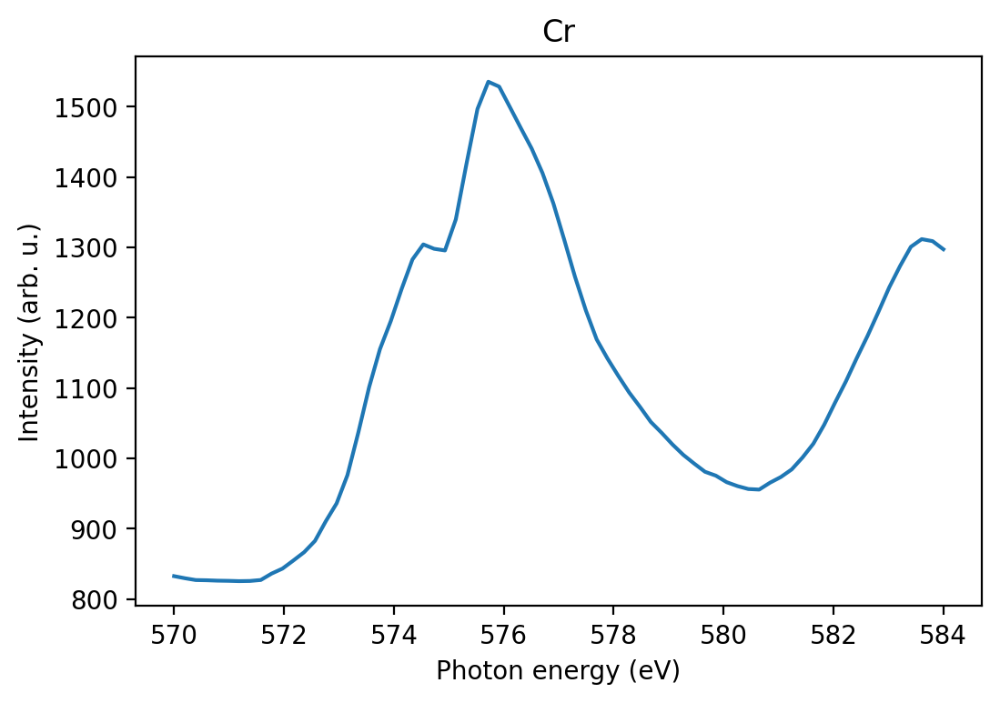

Ni


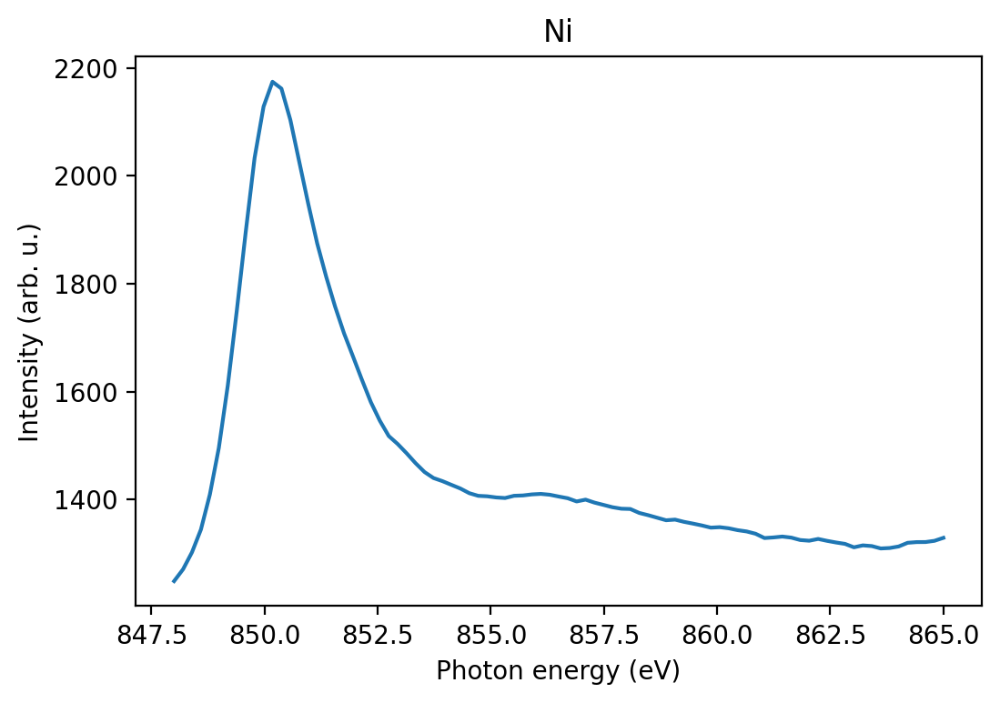

Ti


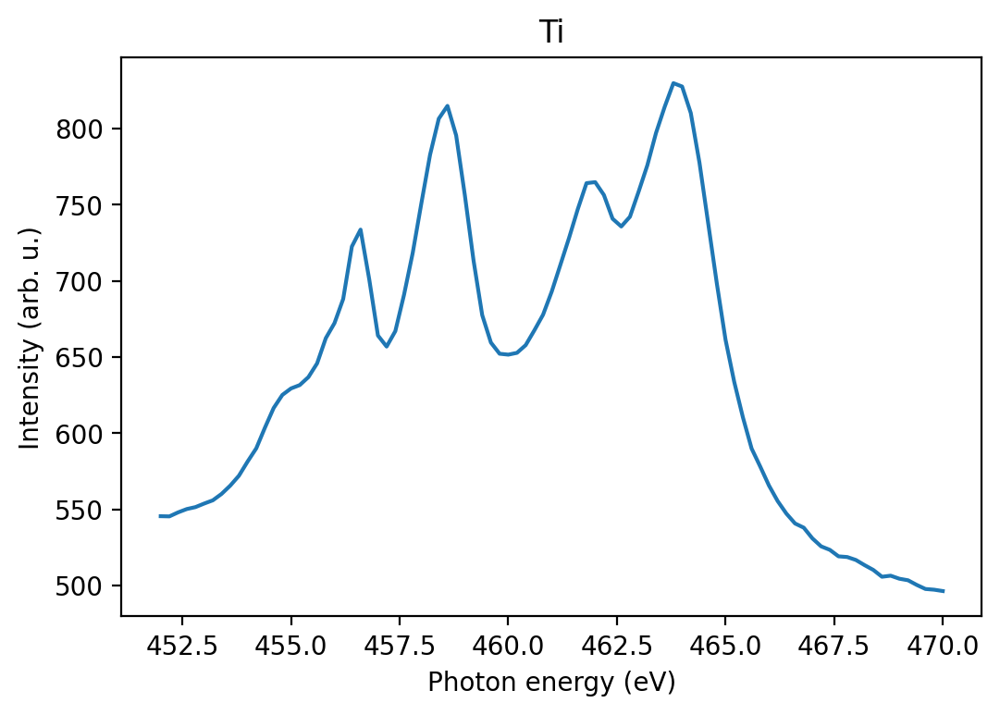

Al


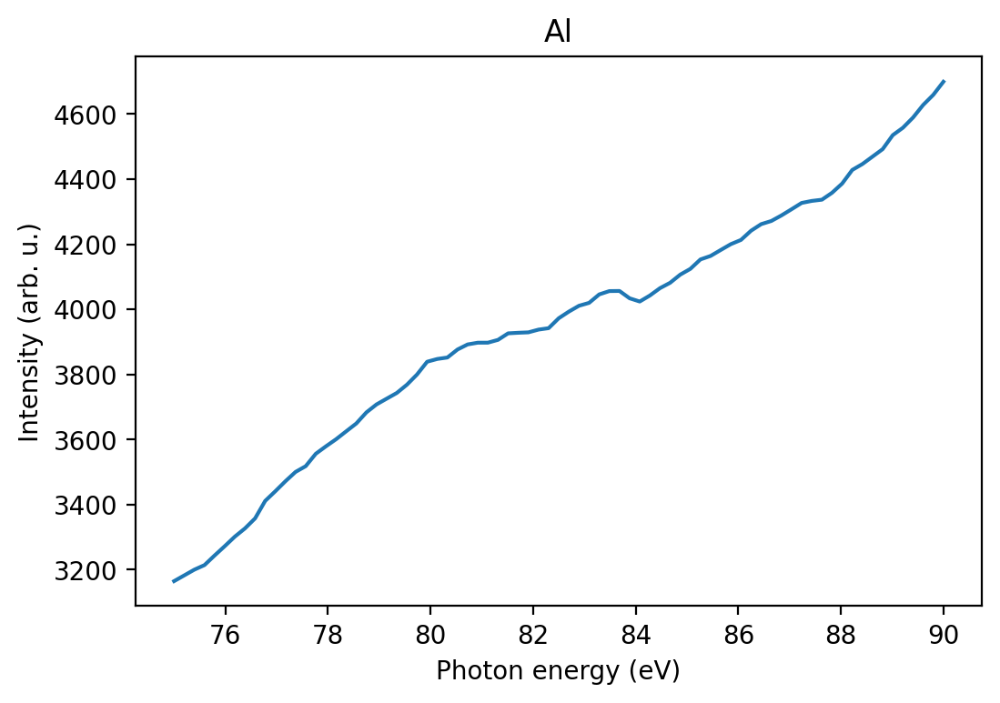

Fe


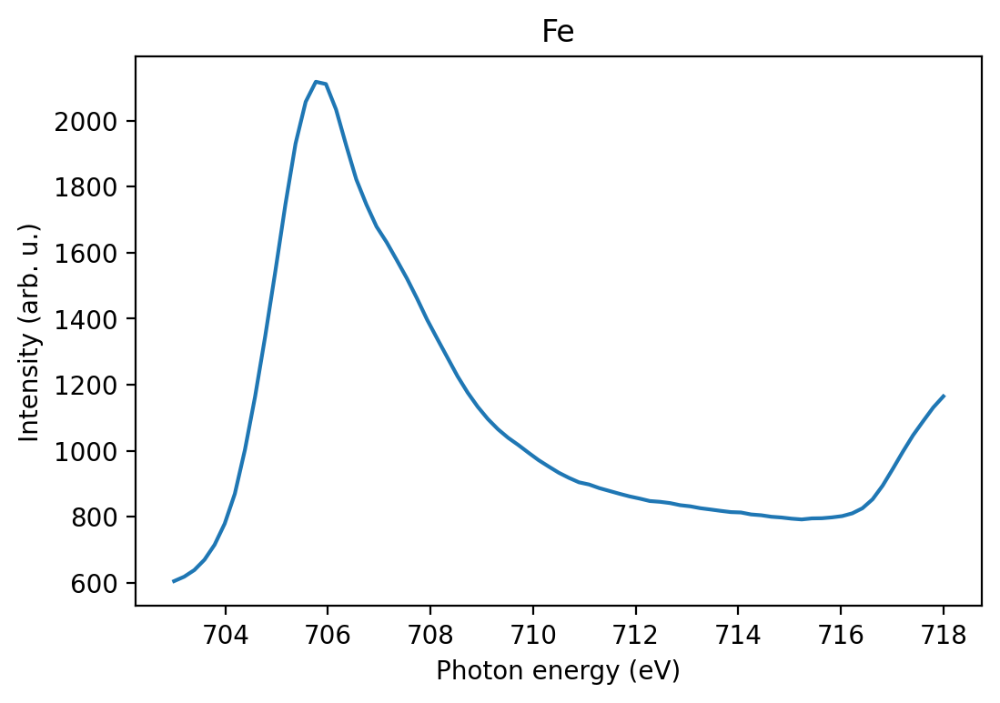

In [ ]:
for i, (element,xas_data) in enumerate(xas_elements.items()):
    print(element)
    plt.plot(xas_photon_energies[element],np.average(xas_data, axis=(1,2)))
    plt.ylabel("Intensity (arb. u.)")
    plt.xlabel("Photon energy (eV)")
    plt.title(element)
    plt.show()


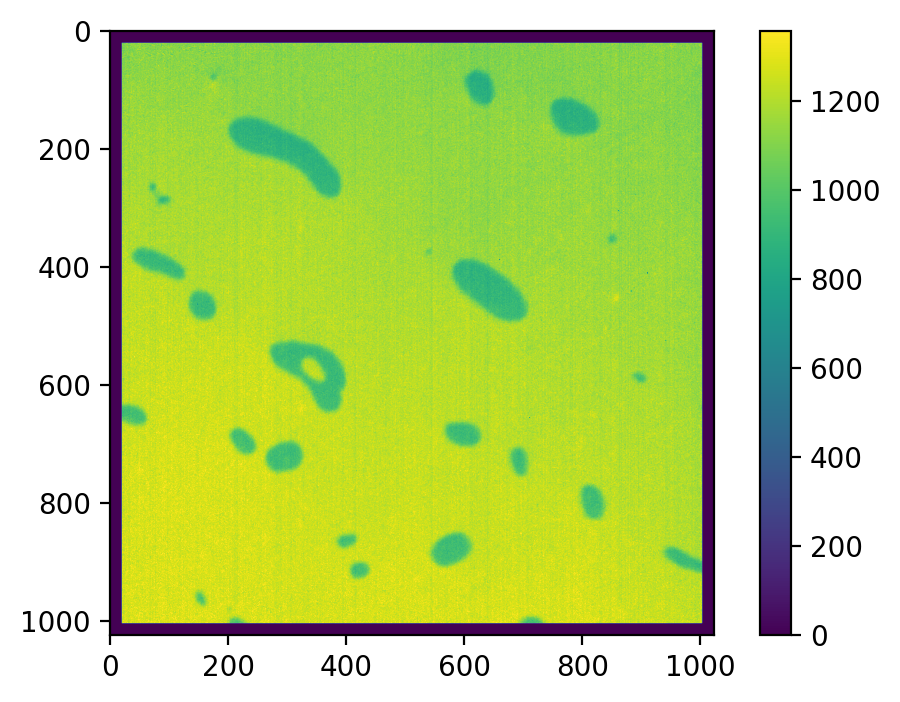

In [ ]:
#find the integral of each pixel to figure out how much intensity of that element there is at each pixel
integral_img = np.average(fe_xas,axis=0)
plt.imshow(integral_img,vmax = np.percentile(integral_img,99),vmin = np.percentile(integral_img,2))
plt.colorbar()

(72, 984, 984)
Cr


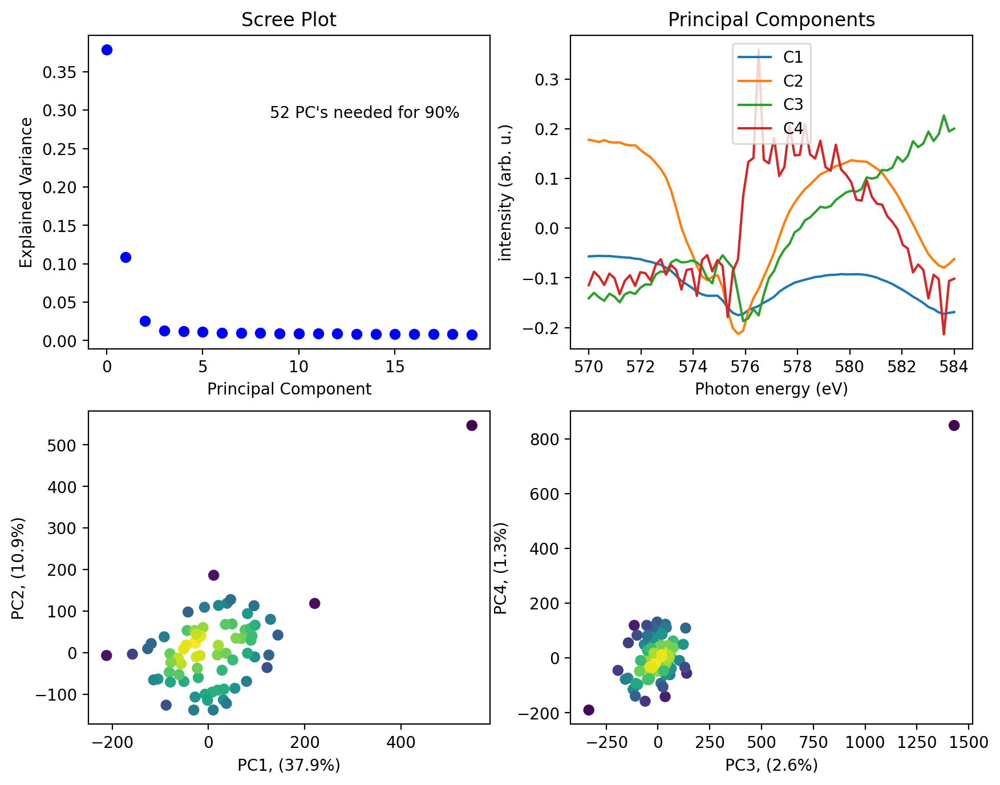

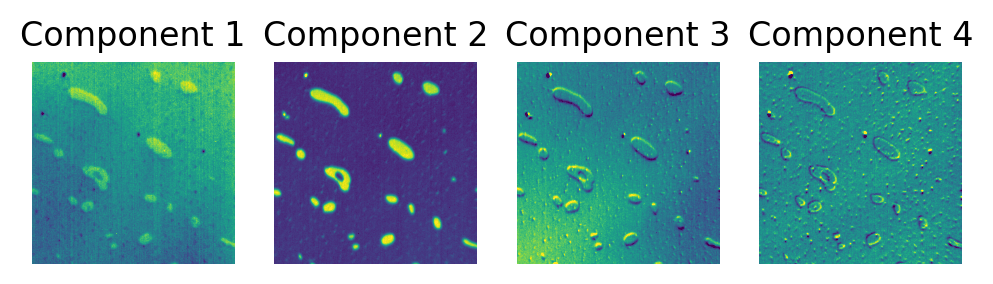

(87, 984, 984)
Ni


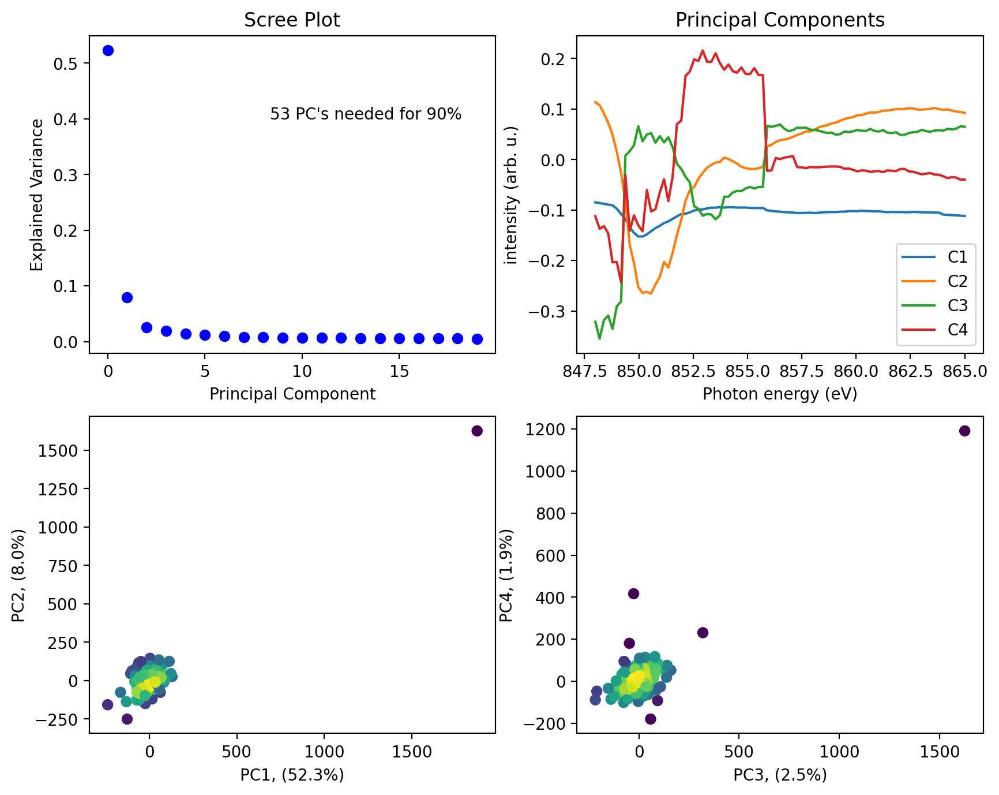

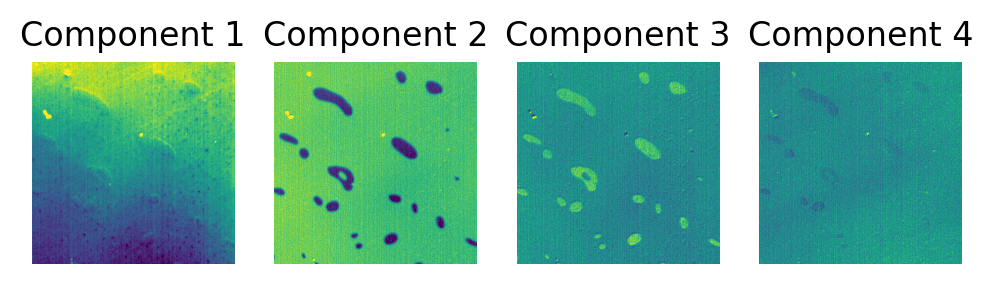

(91, 984, 984)
Ti


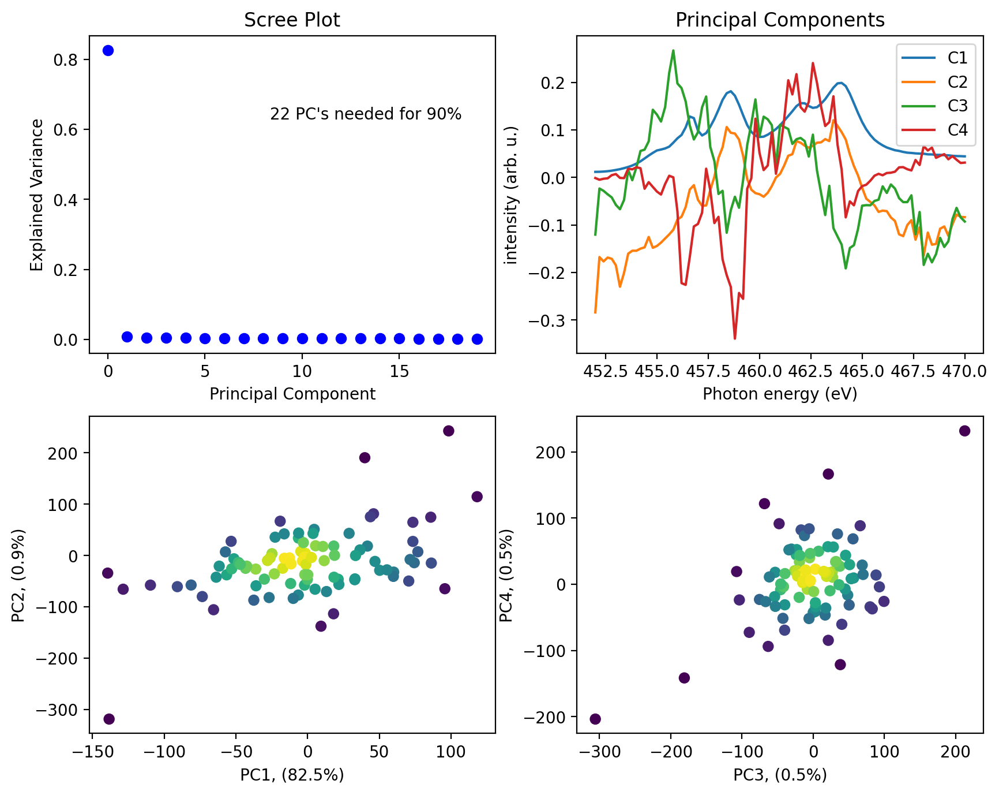

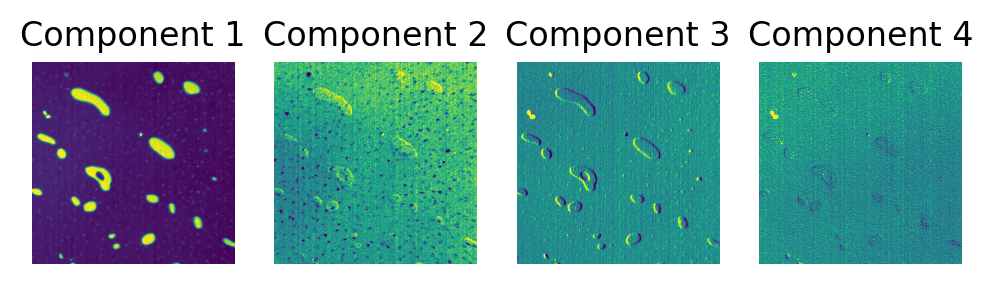

(77, 984, 984)
Al


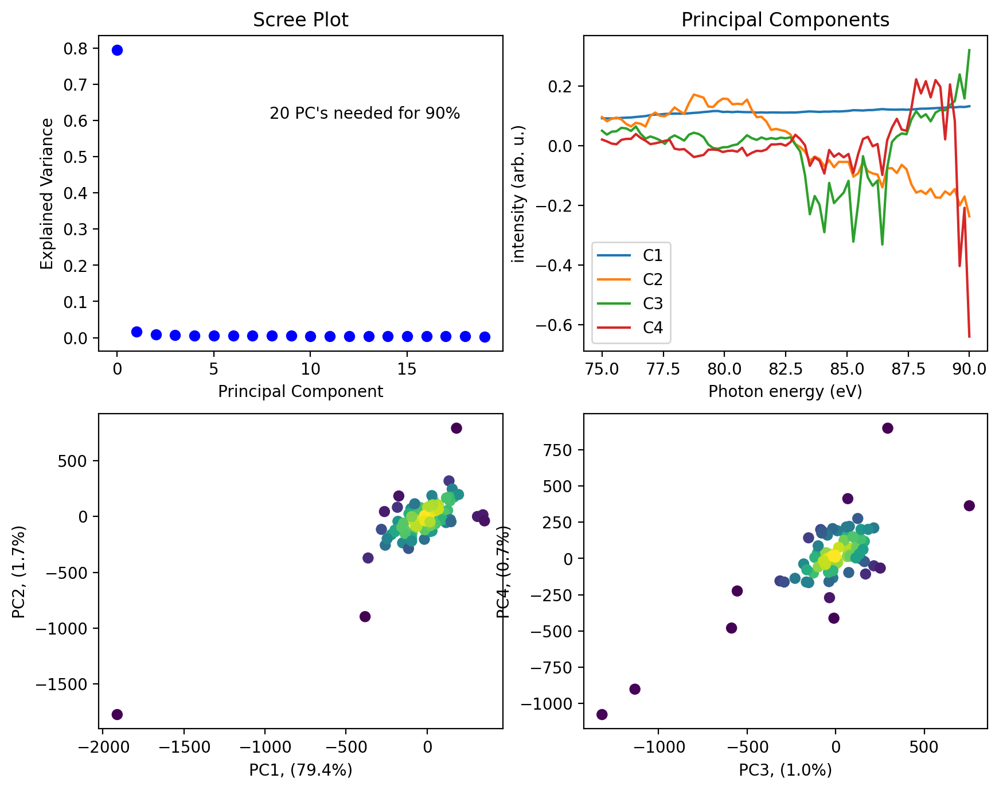

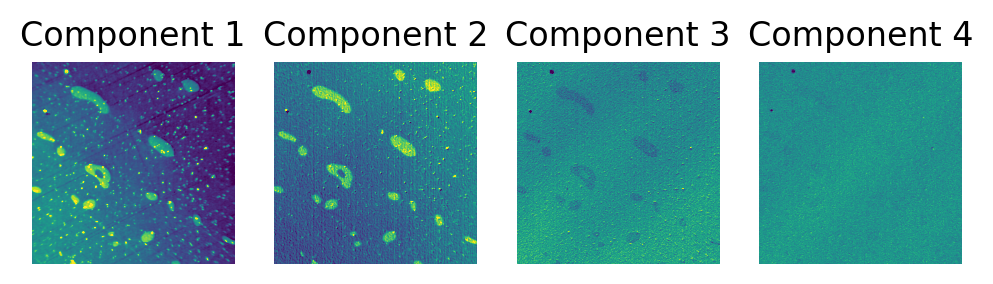

(77, 984, 984)
Fe


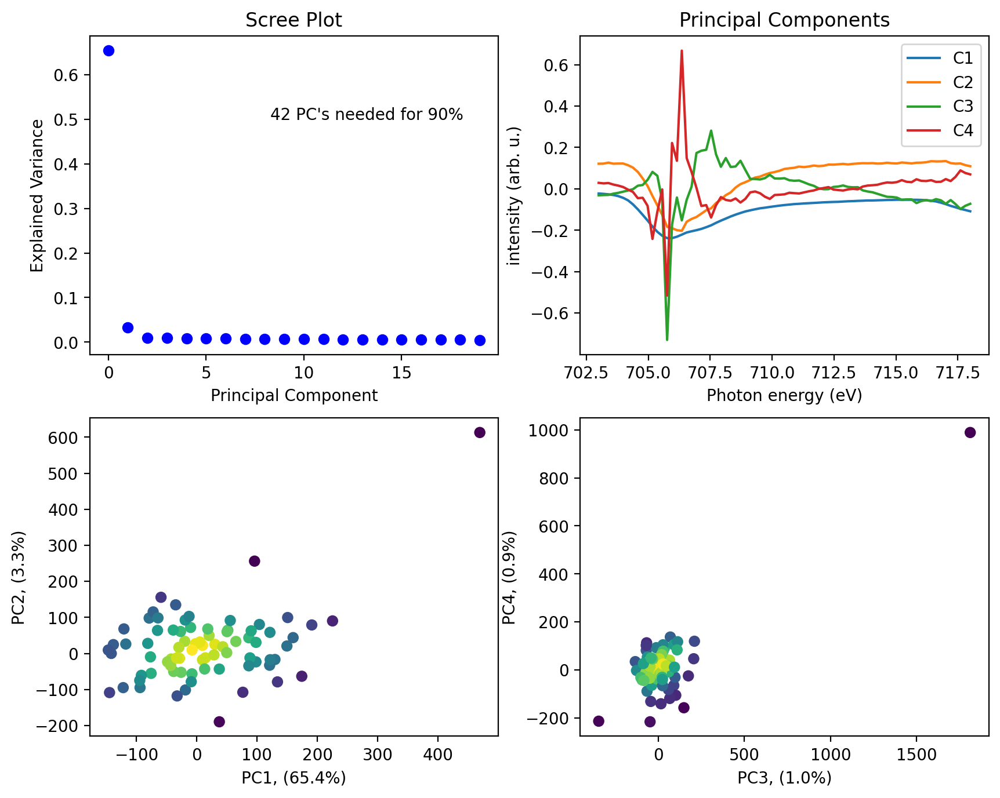

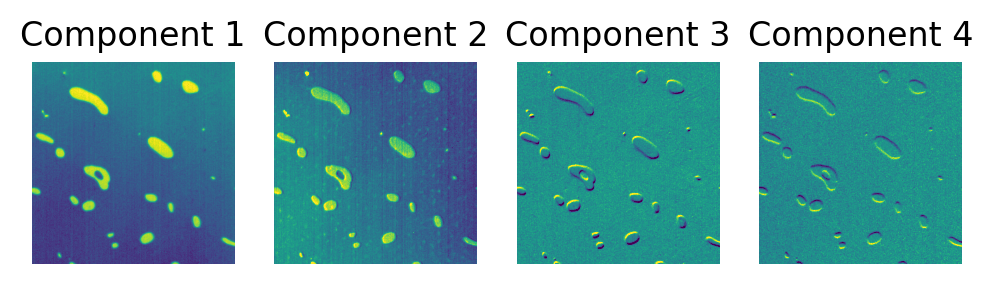

In [ ]:
pca = PCA()
elements_scores = {}

for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)

    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T
    pca_results = pca.fit(element_NxM)
    scores = pca_results.transform(element_NxM)
    elements_scores[element] = scores
    print(element)
    plot_pca_results(pca_results,scores,e_values=xas_photon_energies[element])
    plt.show()
    show_score_imgs(scores,4,imsize=element_data.shape[1])
    plt.show()



In [ ]:
# pca_img_dir = '/Users/apple/Sync/Research/Alloy 72/Segmentation/PCA segmentation/'
# for i, (element,scores) in enumerate(elements_scores.items()):
#     for j in range(4):
#         scoreimg = np.pad(make_16bit((np.reshape(scores[:,j],(984,984)))),(20,20),mode='constant')
#         imsave(pca_img_dir+element+'_pc'+str(j)+'.png',scoreimg)

# plt.imshow(scoreimg)

In [ ]:
stacked_xas = np.vstack([cr_xas,ni_xas,ti_xas,al_xas,fe_xas])
combined_xas = np.reshape(stacked_xas,(404,1024*1024)).T
scaler = StandardScaler()
normed_combined_xas = scaler.fit_transform(combined_xas)

(72, 984, 984)


/Users/apple/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


Cr


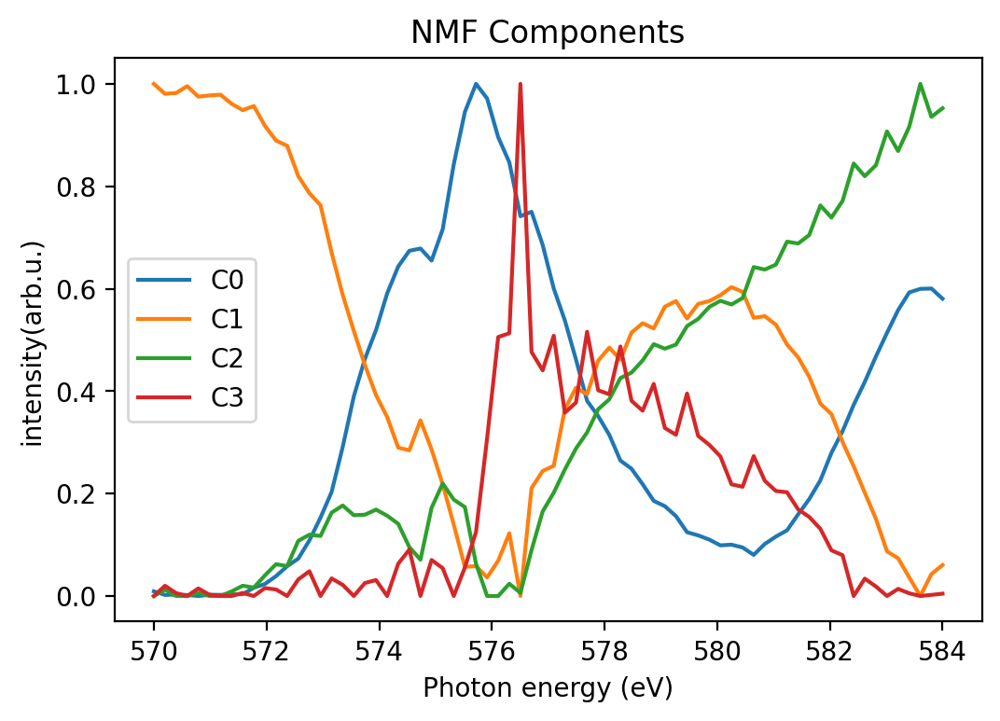

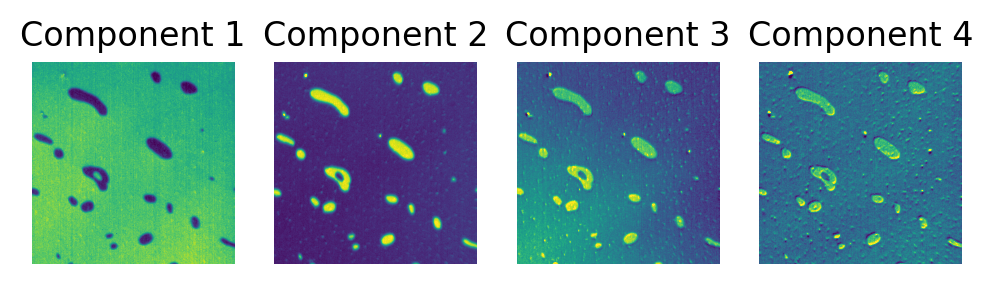

(87, 984, 984)


/Users/apple/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


Ni


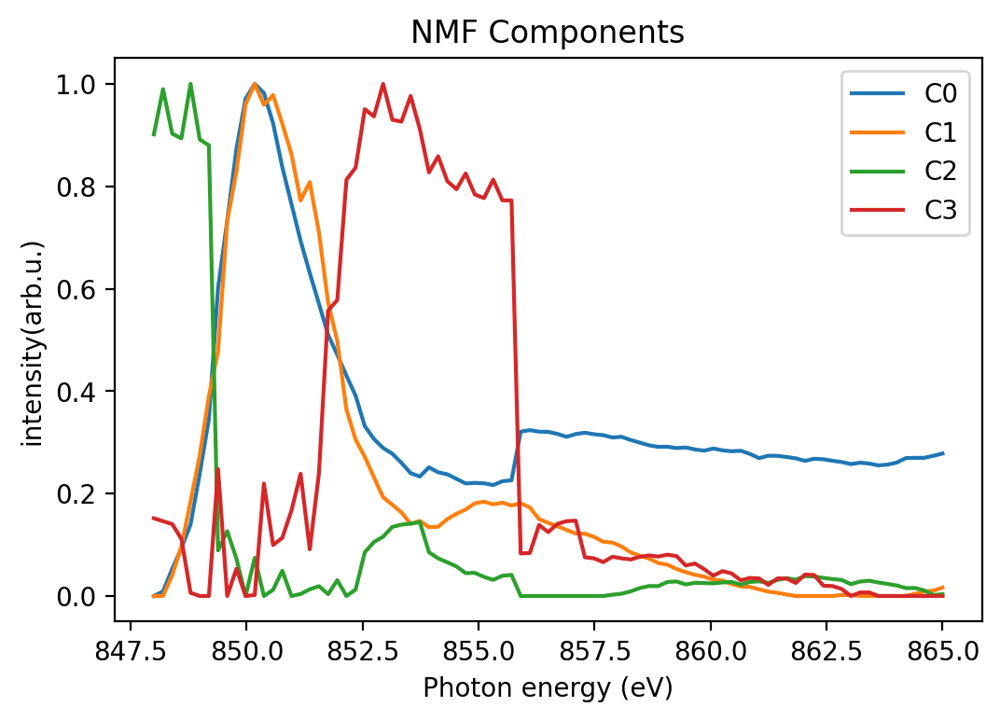

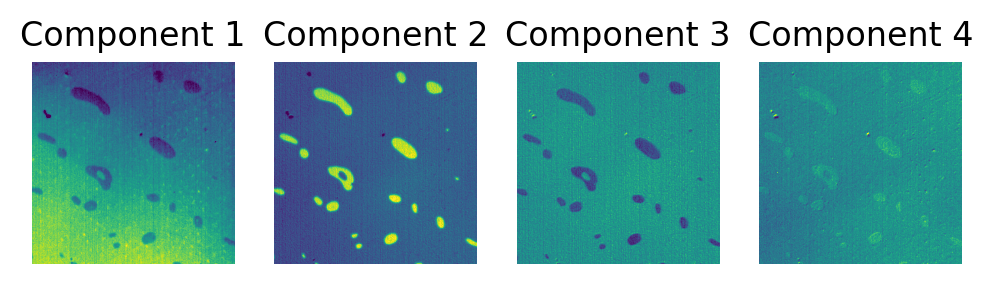

(91, 984, 984)


/Users/apple/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


Ti


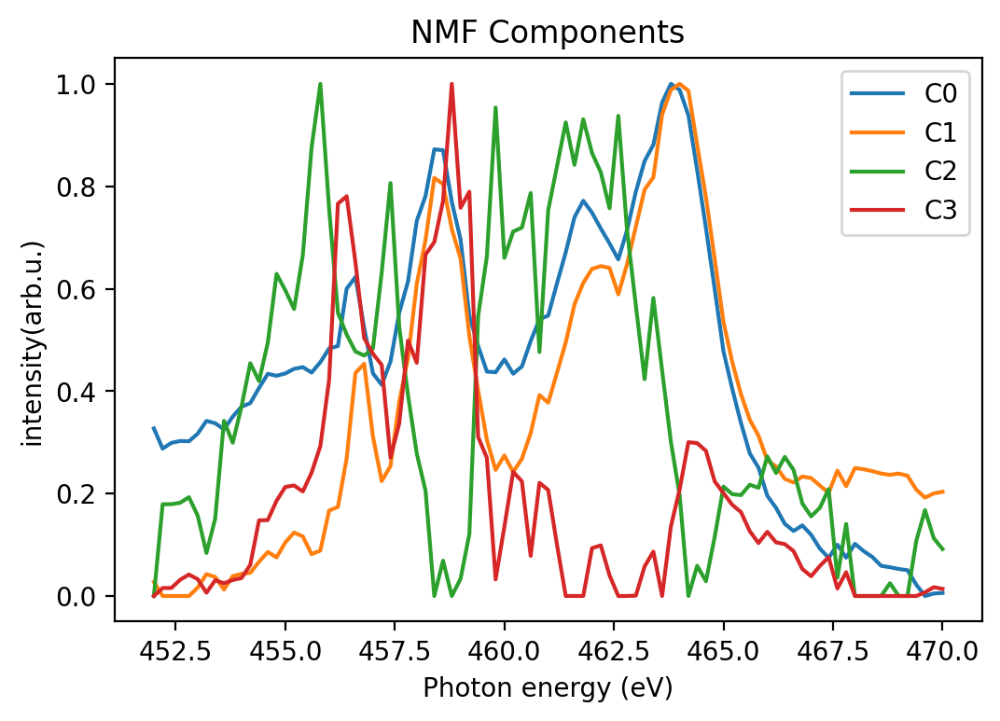

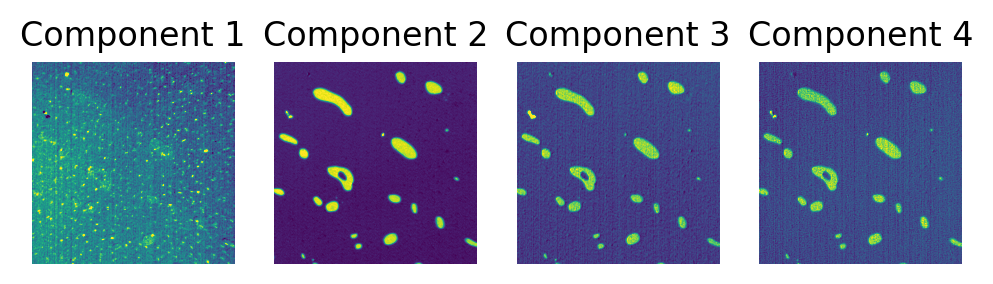

(77, 984, 984)


/Users/apple/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


Al


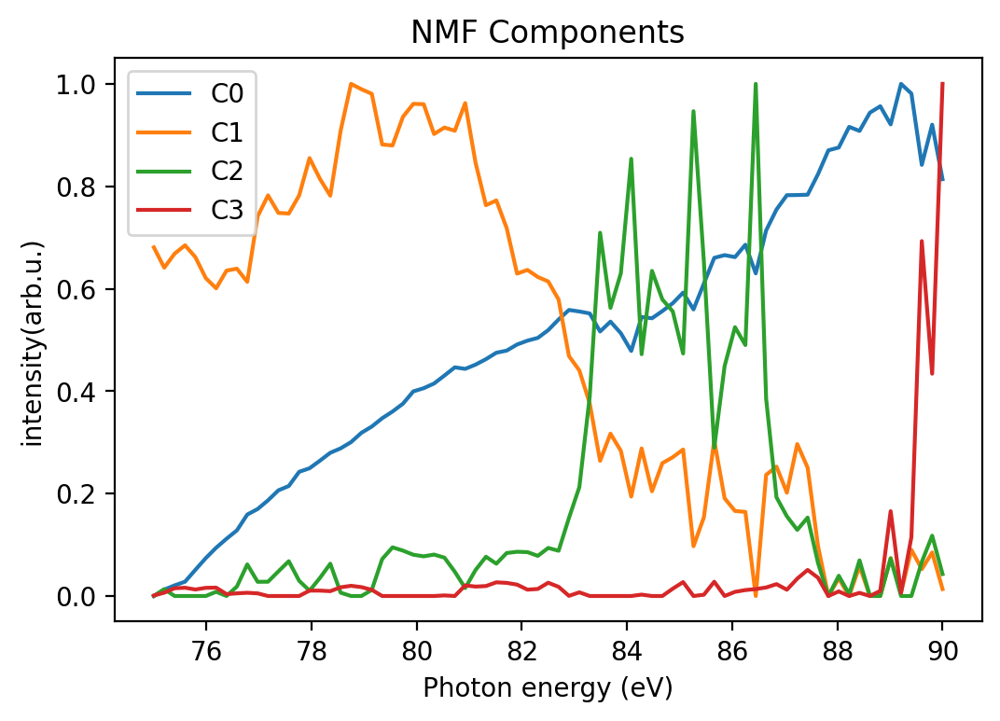

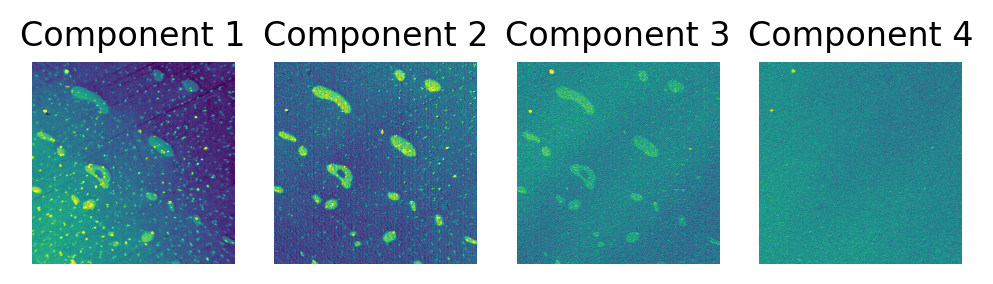

(77, 984, 984)


/Users/apple/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


Fe


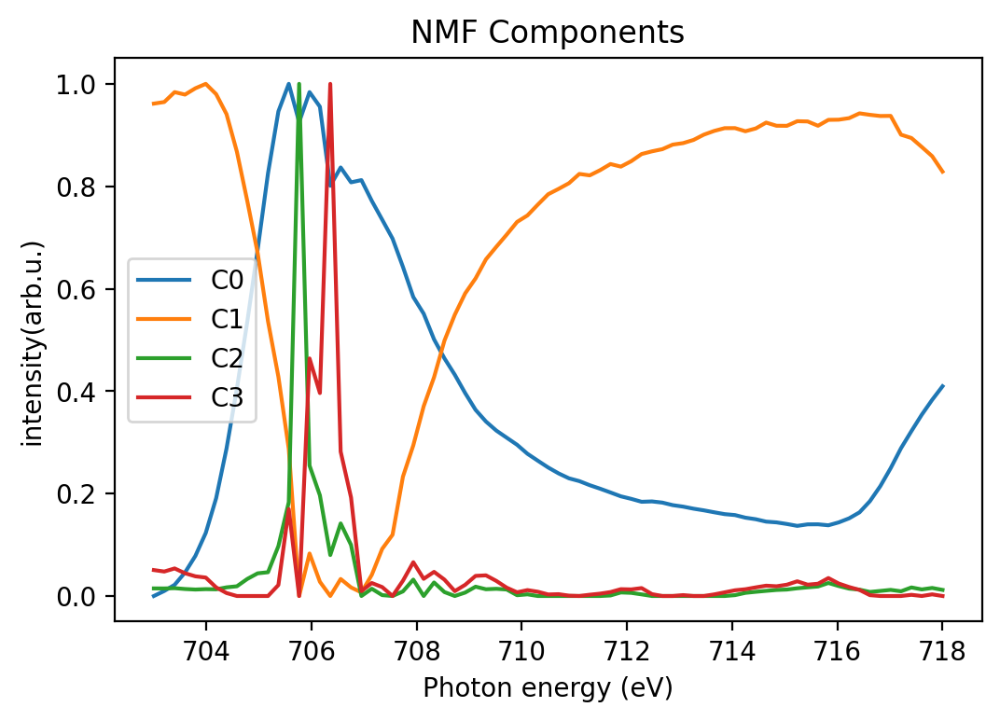

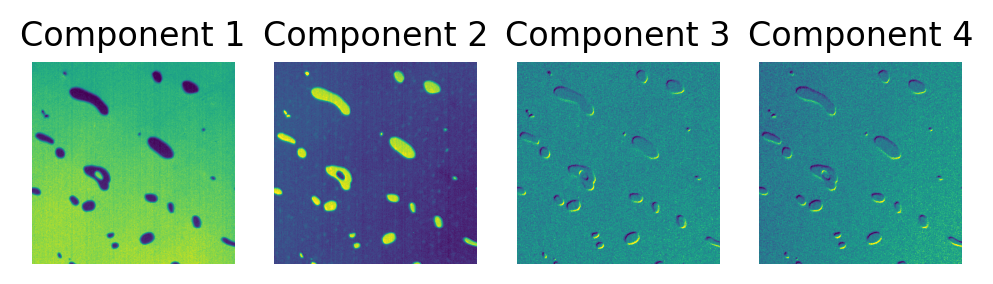

In [ ]:
#calculate NMF for all the components
nmf = NMF(4,init='nndsvd')
for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)

    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T
    nmf_results = nmf.fit(element_NxM)
    scores = nmf_results.transform(element_NxM)
    print(element)
    plot_nmf(nmf_results,e_values=xas_photon_energies[element])
    plt.show()
    show_score_imgs(scores,4,imsize=element_data.shape[1])
    plt.show()

(72, 984, 984)
Cr


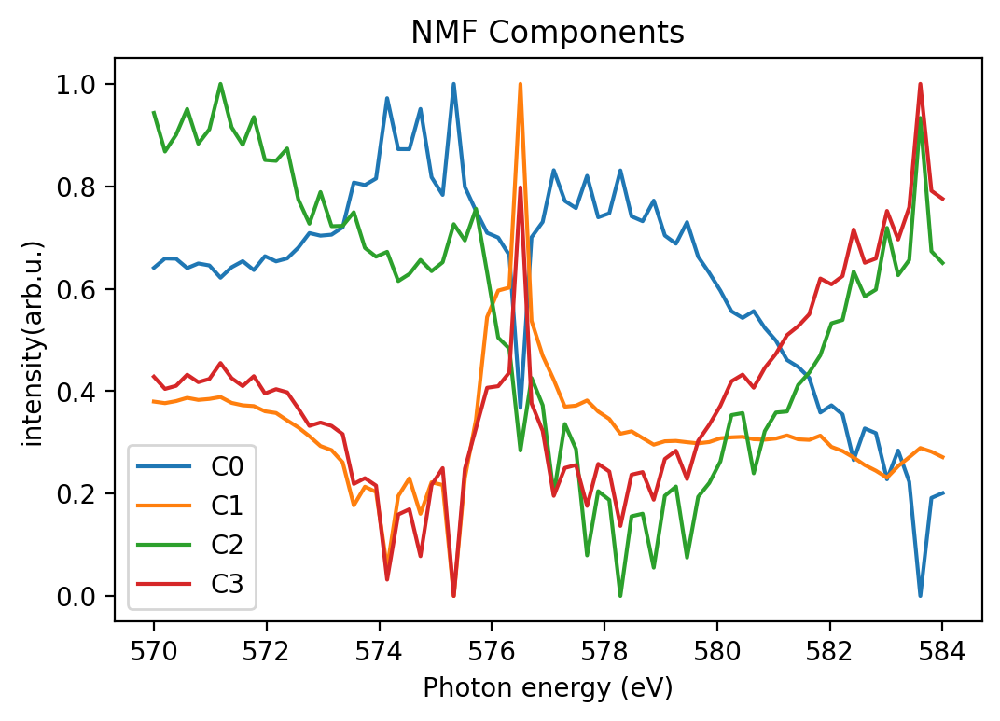

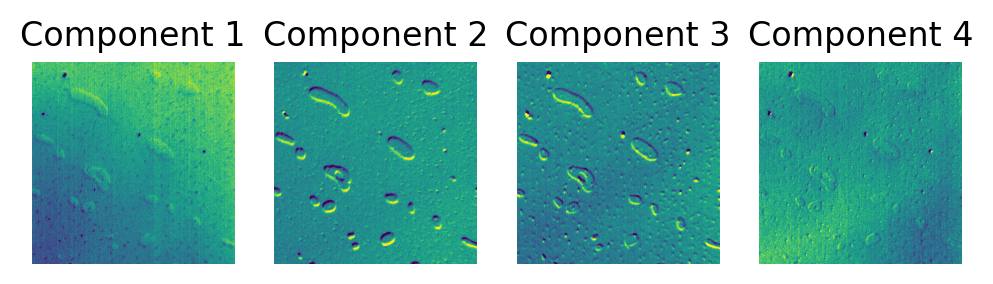

(87, 984, 984)
Ni


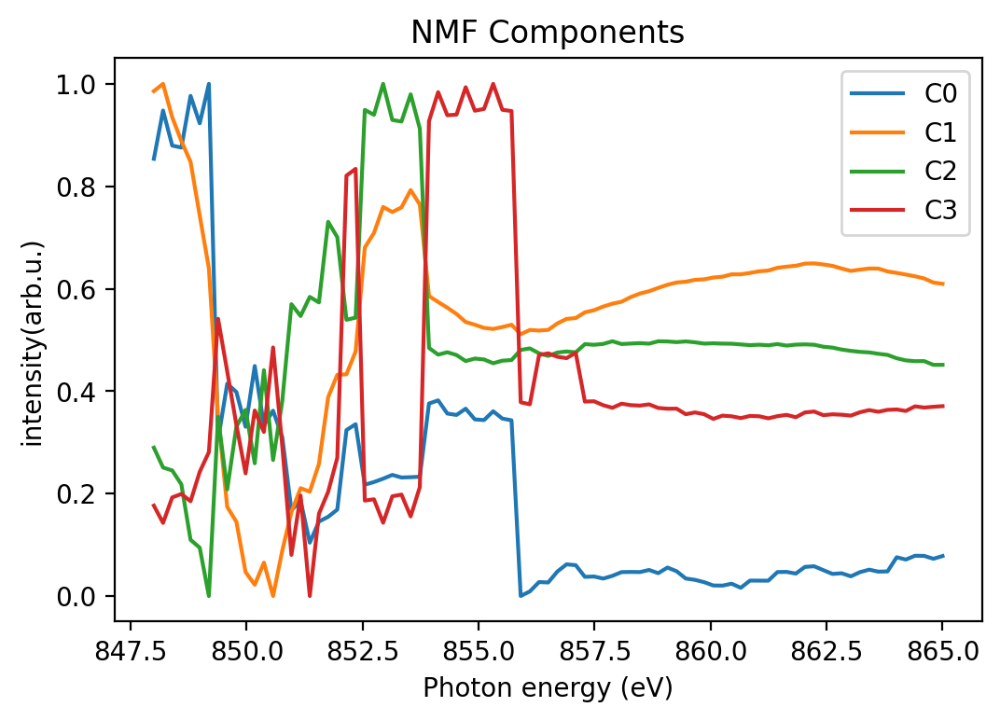

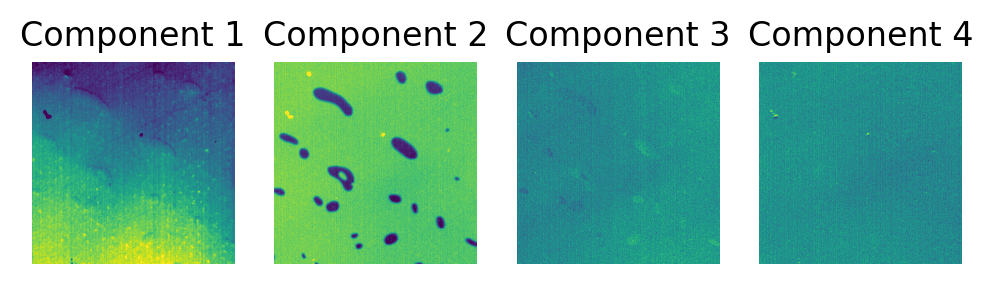

(91, 984, 984)
Ti


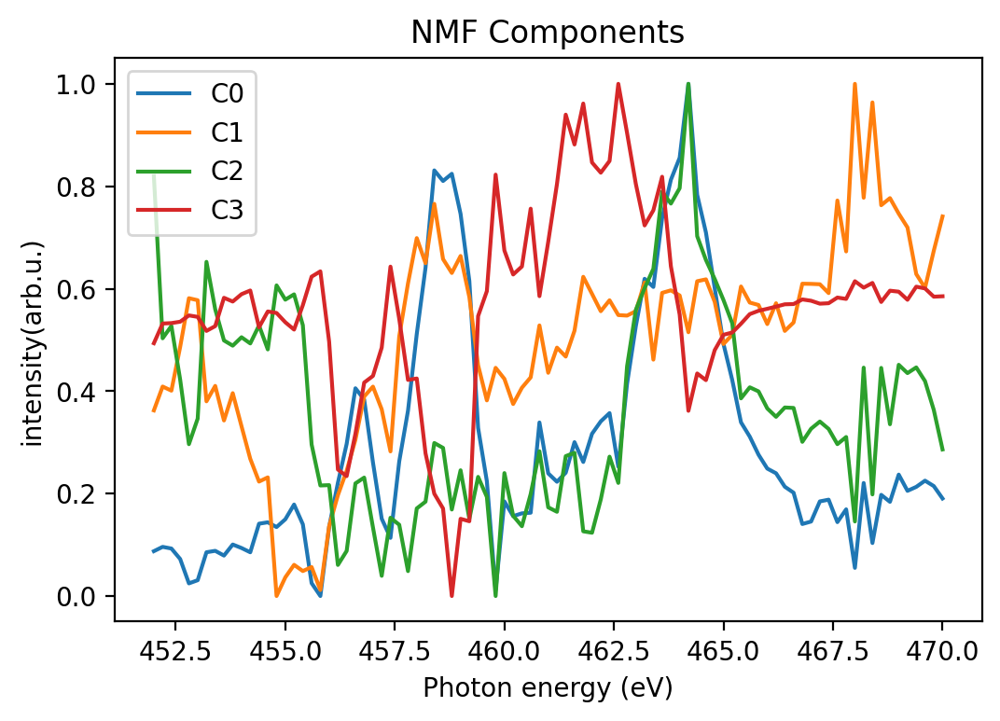

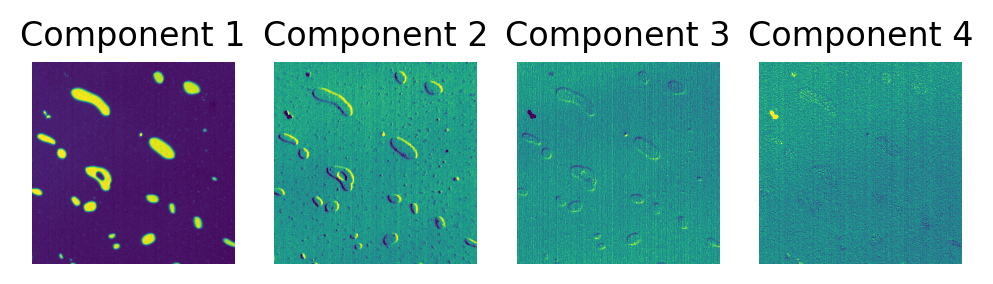

(77, 984, 984)
Al


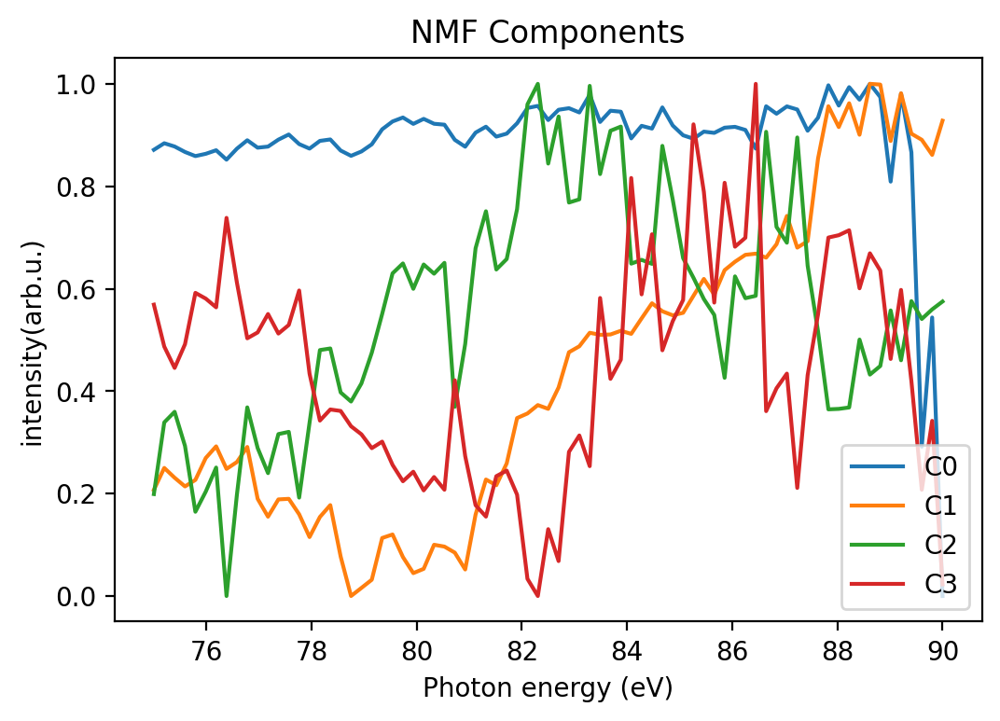

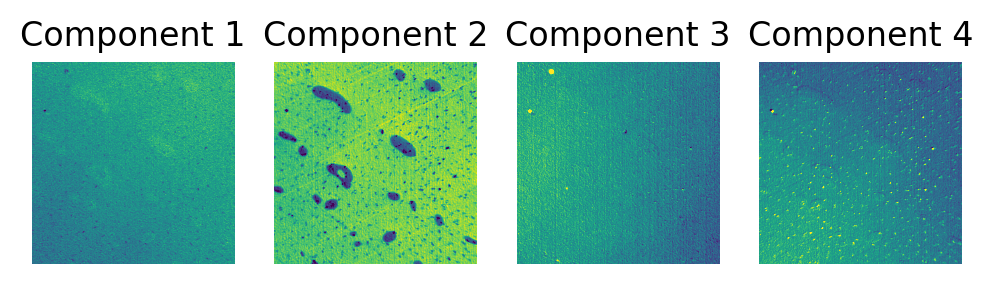

(77, 984, 984)
Fe


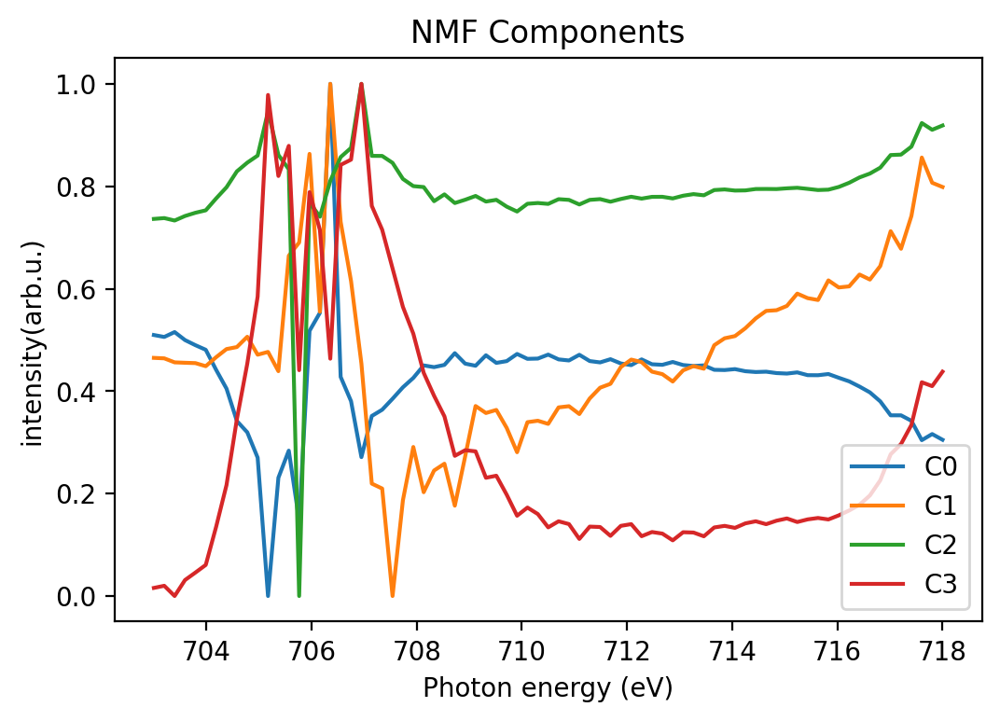

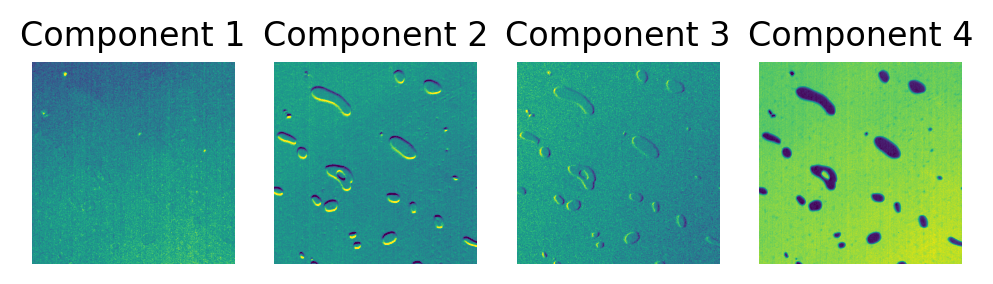

In [ ]:
#calculate ICA for all the components
ica = FastICA(n_components=5)
for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)

    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T
    ica_results = ica.fit(element_NxM)
    scores = ica_results.transform(element_NxM)
    print(element)
    plot_ica(ica_results,n_components=4, e_values=xas_photon_energies[element])
    plt.show()
    show_score_imgs(scores,4,imsize=element_data.shape[1])
    plt.show()

(72, 984, 984)
Cr


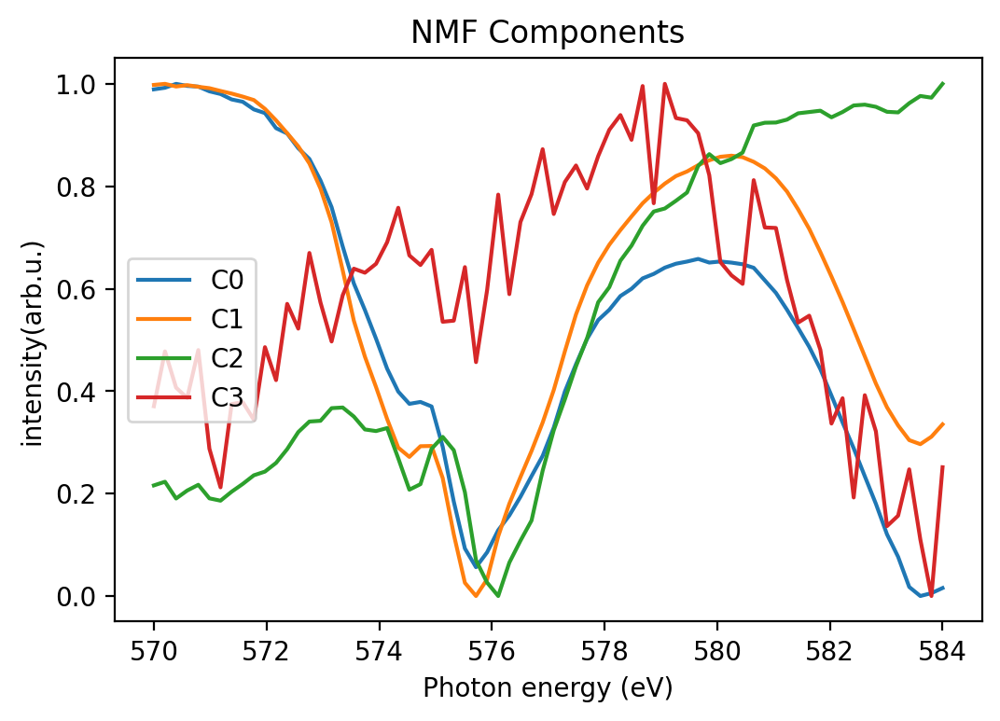

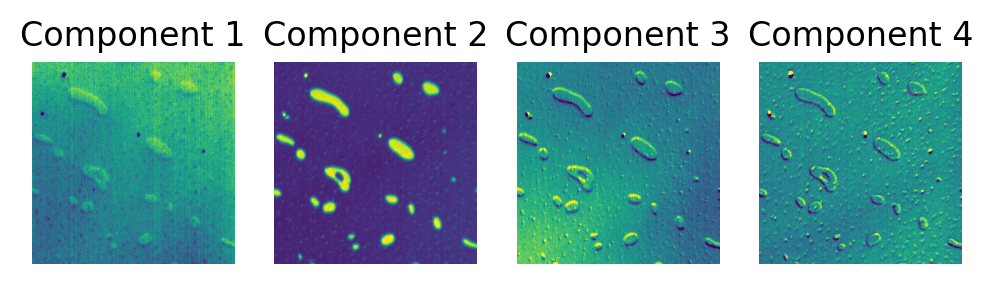

(87, 984, 984)
Ni


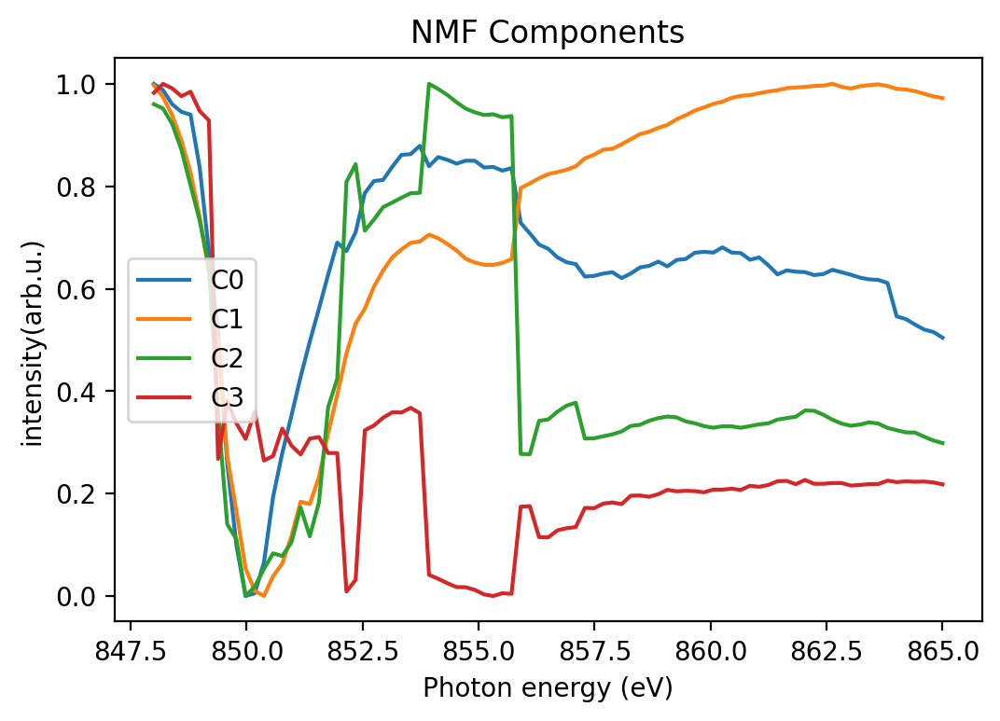

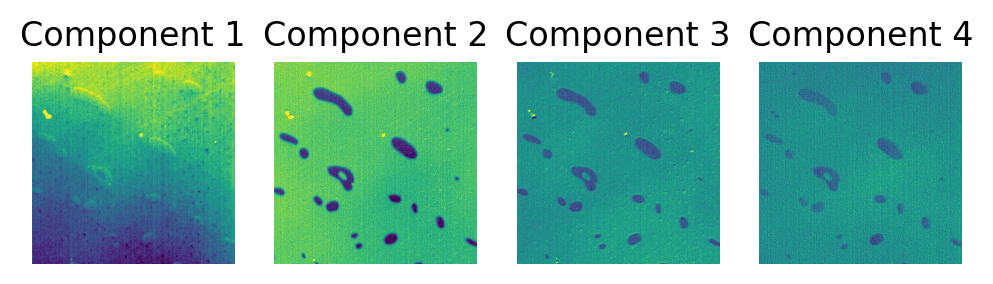

(91, 984, 984)
Ti


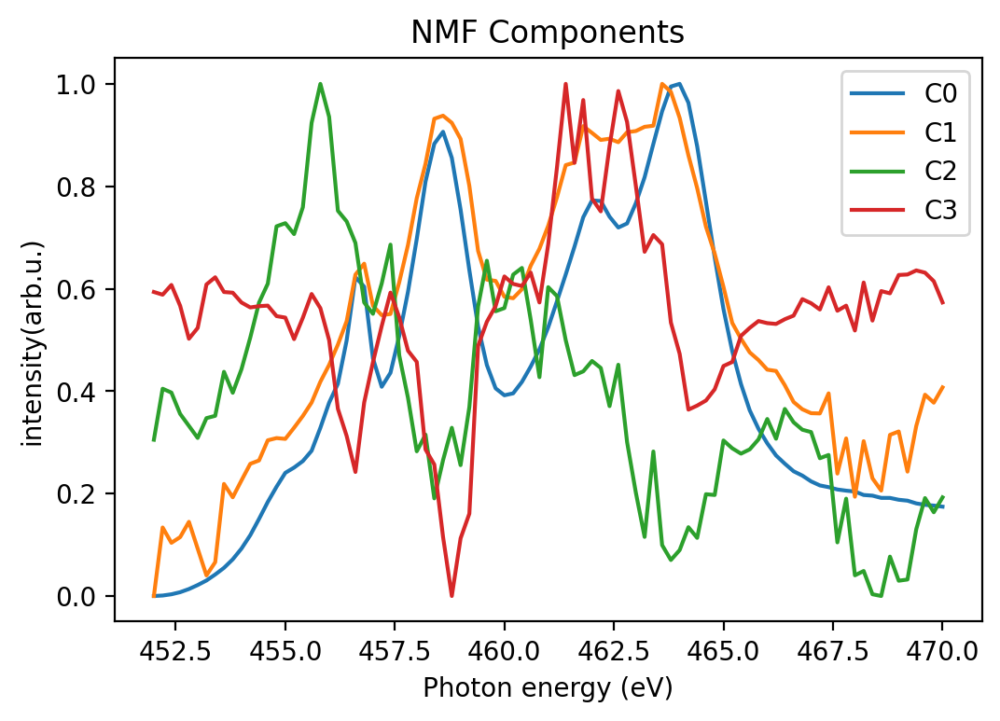

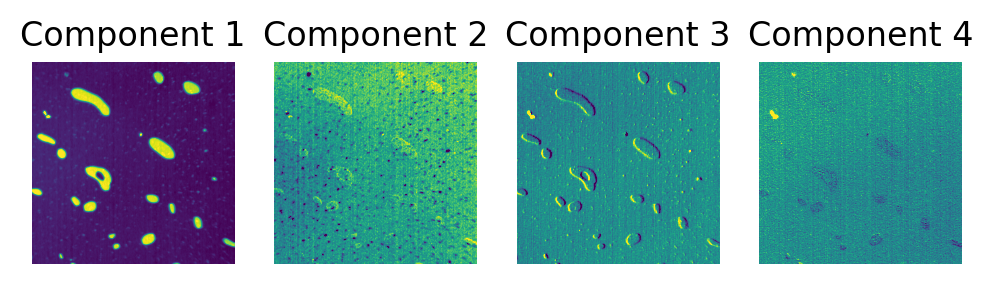

(77, 984, 984)
Al


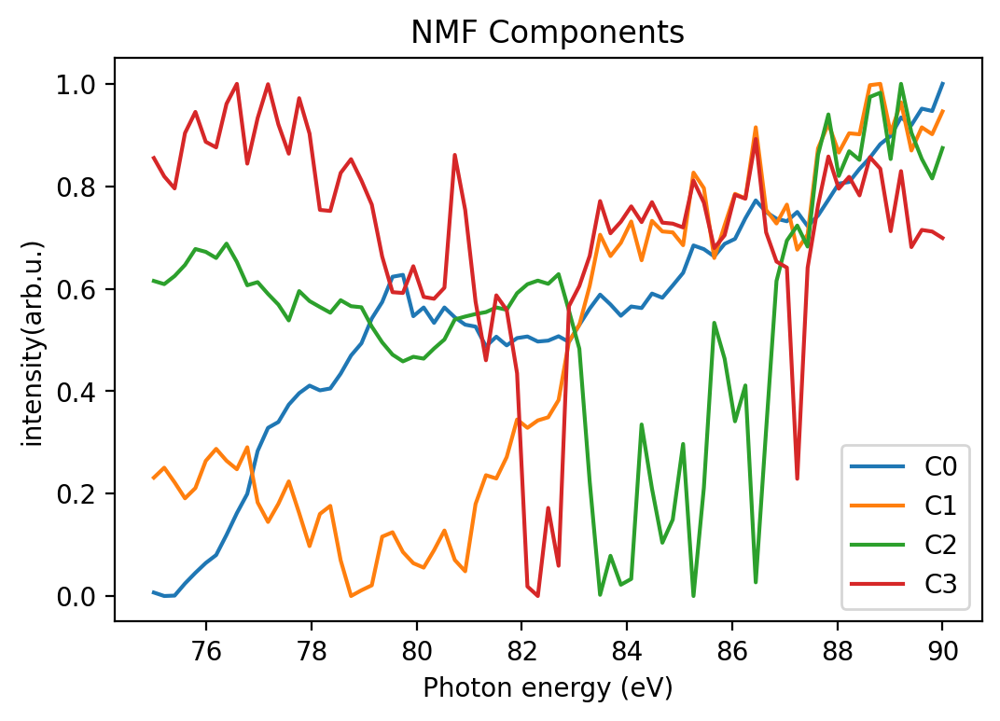

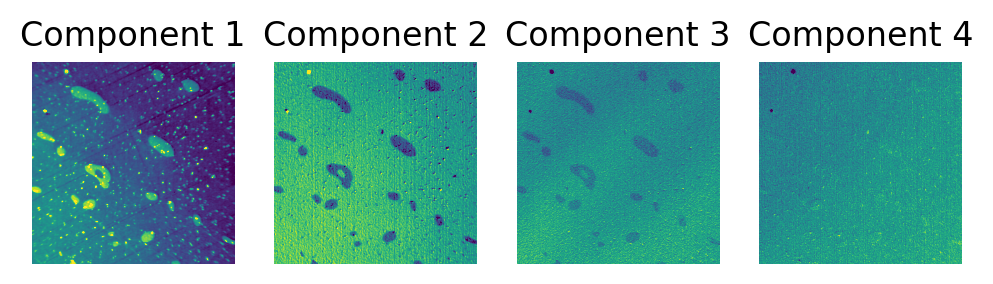

(77, 984, 984)
Fe


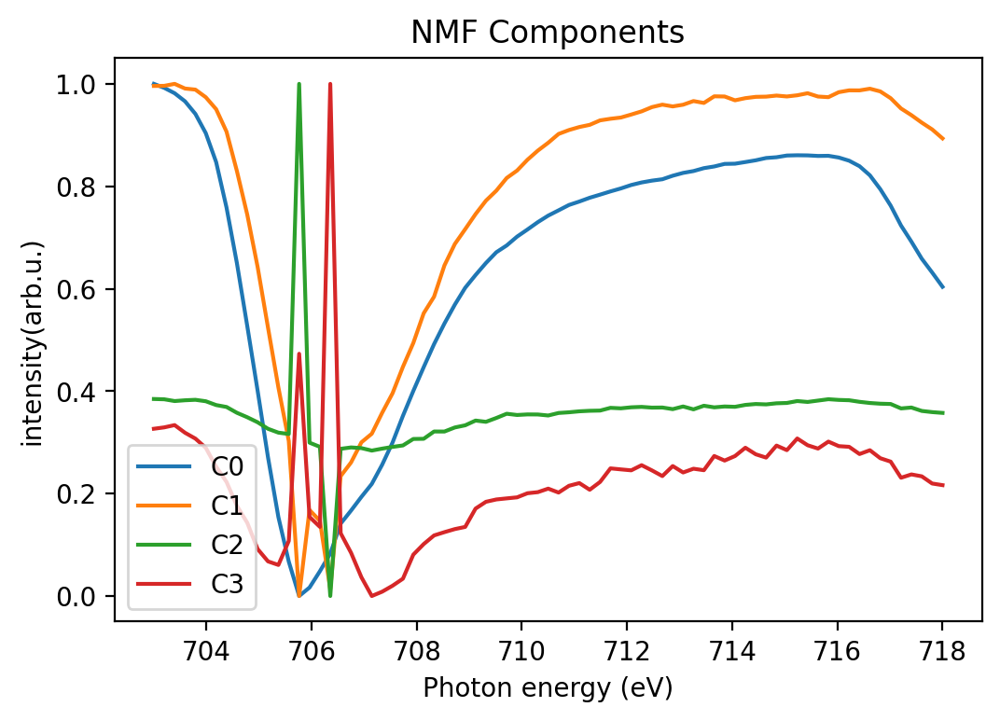

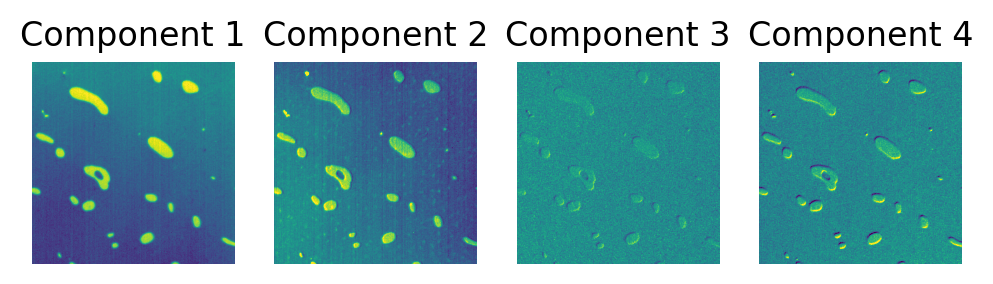

In [ ]:
#calculate Factor Analysis for all the components
factor_analysis = FactorAnalysis(n_components=4)
for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)

    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T
    fa_results = factor_analysis.fit(element_NxM)
    scores = fa_results.transform(element_NxM)
    print(element)
    plot_ica(fa_results,n_components=4, e_values=xas_photon_energies[element])
    plt.show()
    show_score_imgs(scores,4,imsize=element_data.shape[1])
    plt.show()

In [ ]:
#calculate and visualize T-SNE For all the components
# tsne = TSNE(verbose=5)
# pca = PCA()
# for i, (element,xas_data) in enumerate(xas_elements.items()):
#     #print(i,element, xas_data)
#     element_data = trim_edges(xas_data)
#     print(element_data.shape)

#     element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T
#     pca_scores = pca.fit_transform(element_NxM)
#     tsne_results = tsne.fit_transform(pca_scores[:10000,:4])
    
#     pc1v2 = np.vstack([tsne_results[:,0],tsne_results[:,1]])
#     kernel_1v2 = gaussian_kde(pc1v2)
#     density_1v2 = np.reshape(kernel_1v2(pc1v2).T, tsne_results[:,0].shape)
#     plt.scatter(tsne_results[:,0],tsne_results[:,1],c=density_1v2)
#     plt.title("t-SNE of PCA-reduced hyperspectral images")
#     plt.show()
    
 


(72, 984, 984)
Initialization complete
Iteration 0, inertia 56460.96193276083
Iteration 1, inertia 37632.62721069461
Iteration 2, inertia 36797.76812633279
Iteration 3, inertia 36638.27009659923
Iteration 4, inertia 36595.59331032097
Iteration 5, inertia 36566.47840045995
Iteration 6, inertia 36541.67787626581
Iteration 7, inertia 36521.02151464119
Iteration 8, inertia 36504.546640938715
Iteration 9, inertia 36491.993447939385
Iteration 10, inertia 36482.38647748466
Iteration 11, inertia 36474.35297759142
Iteration 12, inertia 36467.34119005774
Iteration 13, inertia 36460.92643119275
Iteration 14, inertia 36454.60295635819
Iteration 15, inertia 36448.273652552634
Iteration 16, inertia 36441.52061714834
Iteration 17, inertia 36433.92965767952
Iteration 18, inertia 36425.04248232815
Iteration 19, inertia 36413.70420328775
Iteration 20, inertia 36398.501396439126
Iteration 21, inertia 36375.29071052643
Iteration 22, inertia 36334.11195081744
Iteration 23, inertia 36246.9733654497
Iteratio

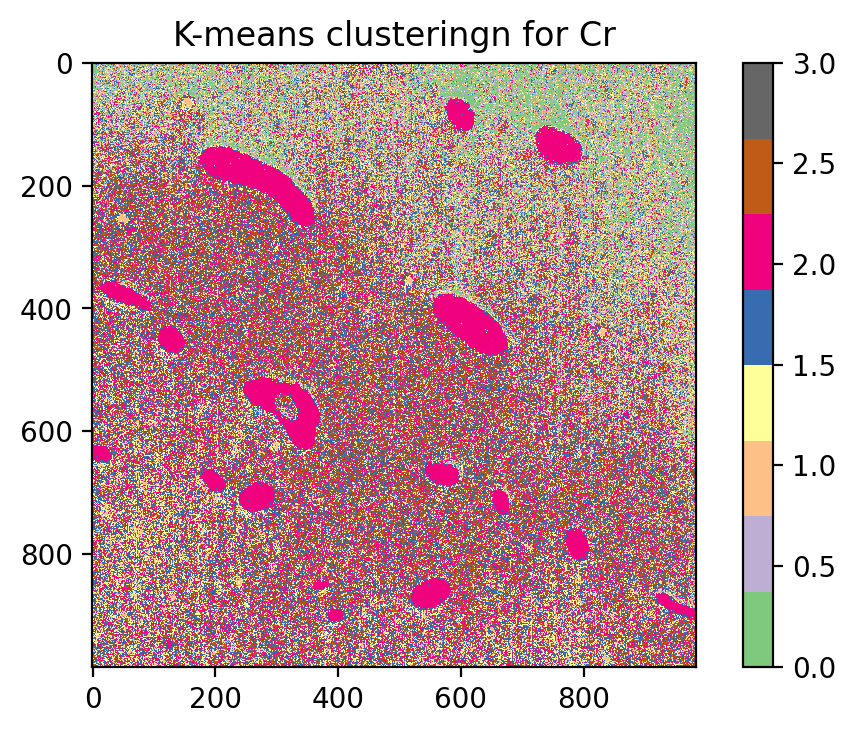

(87, 984, 984)
Initialization complete
Iteration 0, inertia 69155.53737443249
Iteration 1, inertia 41418.931349872095
Iteration 2, inertia 41180.70794053121
Iteration 3, inertia 41055.61880305519
Iteration 4, inertia 40963.69599971288
Iteration 5, inertia 40892.4460602499
Iteration 6, inertia 40836.412202682295
Iteration 7, inertia 40791.597274479485
Iteration 8, inertia 40756.50662663539
Iteration 9, inertia 40729.56316603693
Iteration 10, inertia 40708.54634898458
Iteration 11, inertia 40692.45302689319
Iteration 12, inertia 40680.147934762565
Iteration 13, inertia 40670.74696278084
Iteration 14, inertia 40663.5989319773
Iteration 15, inertia 40657.972630584154
Iteration 16, inertia 40653.52829771431
Iteration 17, inertia 40650.223035810144
Iteration 18, inertia 40647.73119803579
Iteration 19, inertia 40645.824566895084
Iteration 20, inertia 40644.39210100545
Iteration 21, inertia 40643.355530090565
Iteration 22, inertia 40642.621132219836
Iteration 23, inertia 40642.0432347647
Itera

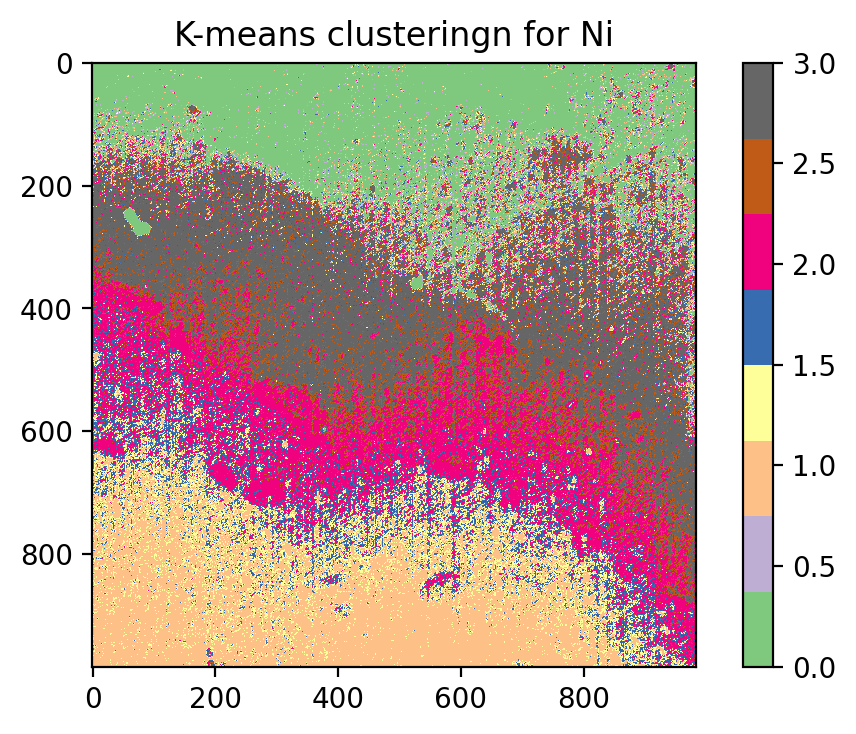

(91, 984, 984)
Initialization complete
Iteration 0, inertia 74767.0609410126
Iteration 1, inertia 43061.02218873206
Iteration 2, inertia 42155.714281491135
Iteration 3, inertia 42097.64059478622
Iteration 4, inertia 42079.26139067562
Iteration 5, inertia 42072.15552610169
Iteration 6, inertia 42069.332308259385
Iteration 7, inertia 42068.15338948701
Iteration 8, inertia 42067.66729027197
Iteration 9, inertia 42067.45124723307
Converged at iteration 9: center shift 2.1915185723611722e-07 within tolerance 2.387994972117131e-07.
Initialization complete
Iteration 0, inertia 74092.41165205771
Iteration 1, inertia 42204.141306321435
Iteration 2, inertia 42072.55911041449
Iteration 3, inertia 42069.13884772873
Iteration 4, inertia 42068.1836332393
Iteration 5, inertia 42067.72842854306
Iteration 6, inertia 42067.50794580655
Iteration 7, inertia 42067.400901806664
Converged at iteration 7: center shift 1.881499002151622e-07 within tolerance 2.387994972117131e-07.
Initialization complete
Iterat

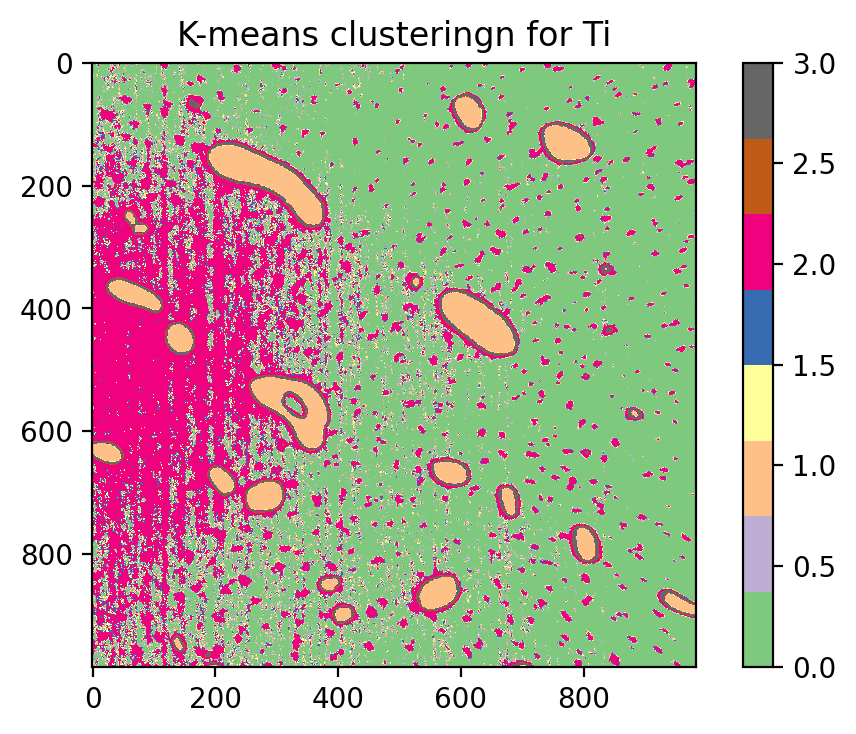

(77, 984, 984)
Initialization complete
Iteration 0, inertia 30338.686528531805
Iteration 1, inertia 19038.547613674153
Iteration 2, inertia 18164.139455153916
Iteration 3, inertia 17665.305614803005
Iteration 4, inertia 17427.759568566355
Iteration 5, inertia 17308.827796641828
Iteration 6, inertia 17247.861030985547
Iteration 7, inertia 17216.58149927107
Iteration 8, inertia 17201.27739985013
Iteration 9, inertia 17193.999996237017
Iteration 10, inertia 17190.668007826738
Iteration 11, inertia 17189.09990528308
Iteration 12, inertia 17188.372301799205
Iteration 13, inertia 17188.037613880057
Iteration 14, inertia 17187.89469664237
Iteration 15, inertia 17187.829136604432
Iteration 16, inertia 17187.798847335118
Iteration 17, inertia 17187.78276016385
Converged at iteration 17: center shift 2.8001792264849516e-08 within tolerance 7.704543229680265e-08.
Initialization complete
Iteration 0, inertia 33990.383379904786
Iteration 1, inertia 17606.847207479444
Iteration 2, inertia 17282.2108

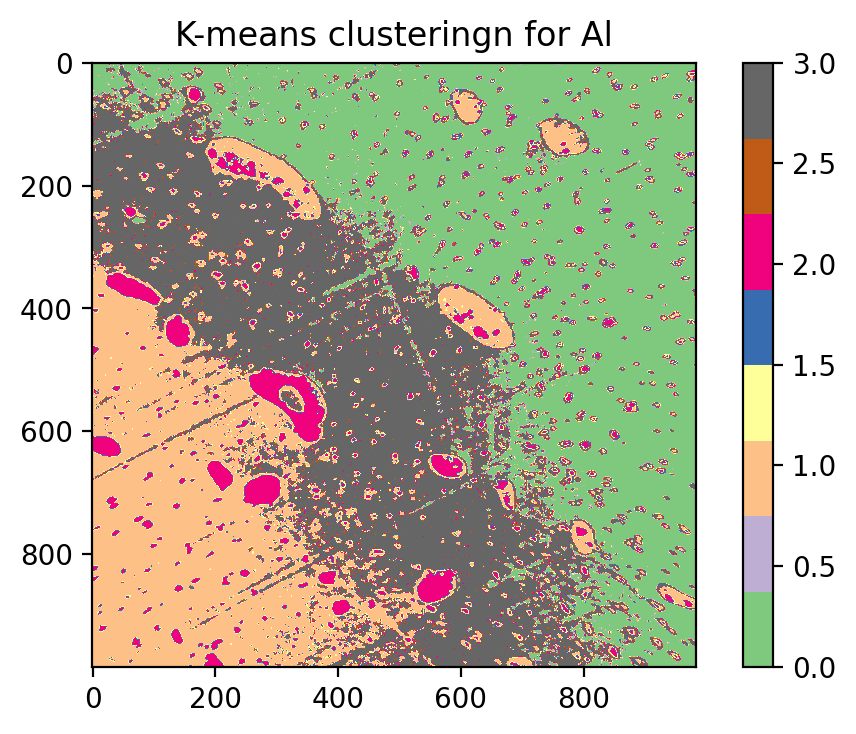

(77, 984, 984)
Initialization complete
Iteration 0, inertia 87034.20803974234
Iteration 1, inertia 50359.0541049029
Iteration 2, inertia 46118.837484605785
Iteration 3, inertia 45658.18531313148
Iteration 4, inertia 45530.14989172294
Iteration 5, inertia 45466.29981274999
Iteration 6, inertia 45427.706591205235
Iteration 7, inertia 45402.559231401974
Iteration 8, inertia 45386.01035280035
Iteration 9, inertia 45374.97371110926
Iteration 10, inertia 45367.68437966924
Iteration 11, inertia 45363.0081589767
Iteration 12, inertia 45359.84674578802
Iteration 13, inertia 45357.75359487661
Iteration 14, inertia 45356.41437248125
Iteration 15, inertia 45355.519725383485
Iteration 16, inertia 45354.93650522084
Iteration 17, inertia 45354.54062698698
Iteration 18, inertia 45354.26833841356
Iteration 19, inertia 45354.09048139961
Iteration 20, inertia 45353.971264889966
Iteration 21, inertia 45353.889731919626
Converged at iteration 21: center shift 9.743257069999054e-08 within tolerance 1.360041

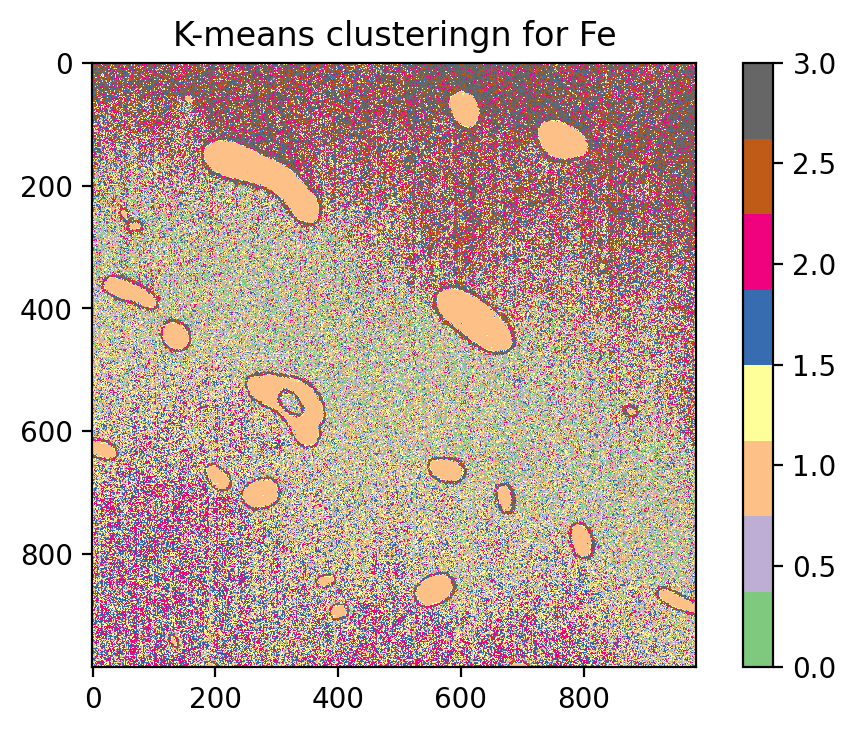

In [ ]:
kmeans = KMeans(n_clusters=4,verbose=5)
std_scale = MinMaxScaler()
for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)

    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T


    kmeans_results = kmeans.fit_transform(std_scale.fit_transform(element_NxM))
    #tsne_reduced = tsne_results.transform(element_NxM)

    plt.imshow(np.reshape(kmeans.labels_,(984,984)),cmap='Accent')
    plt.title('K-means clusteringn for ' + element)
    plt.colorbar()
    plt.show()
    
    

(72, 984, 984)


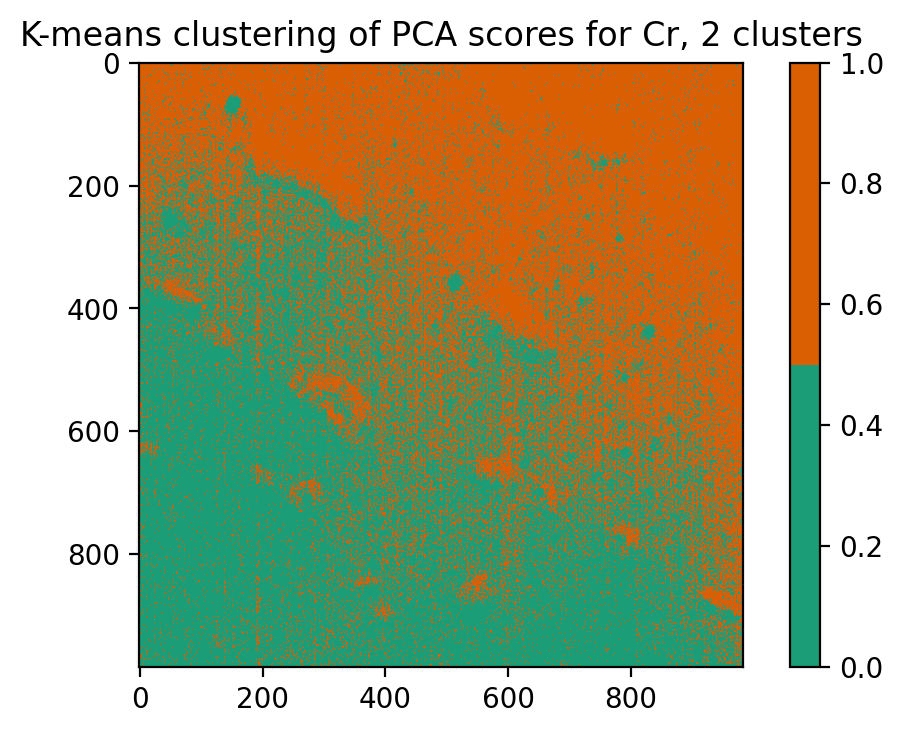

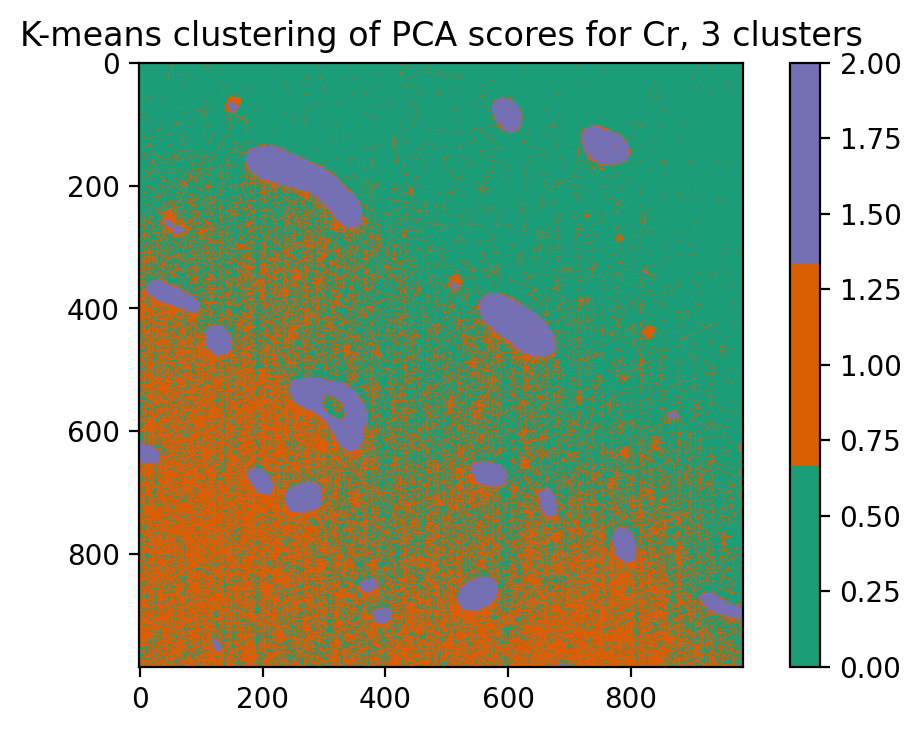

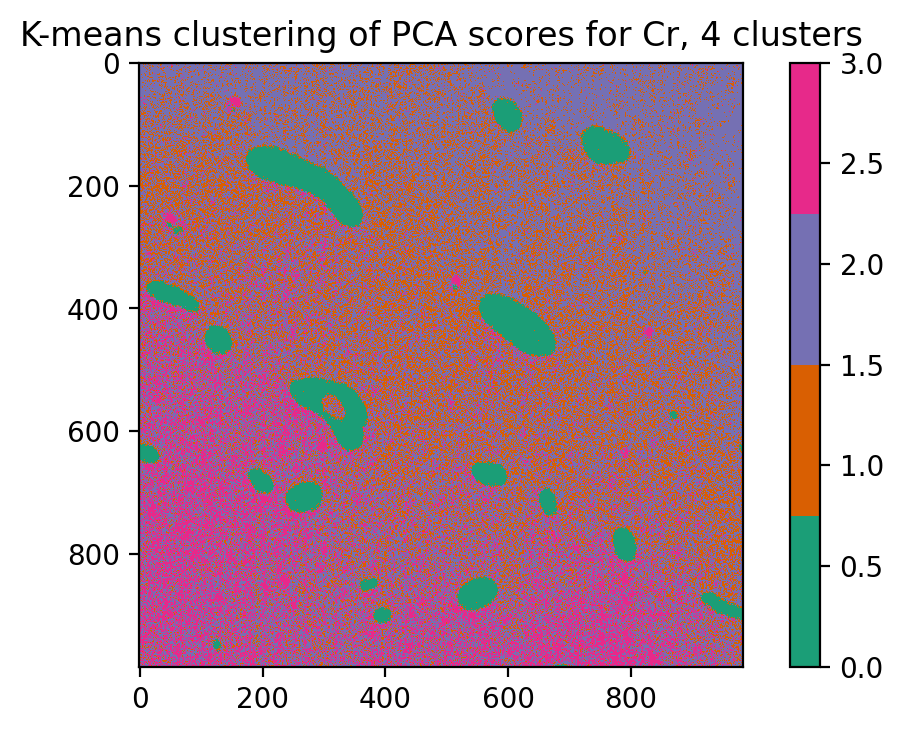

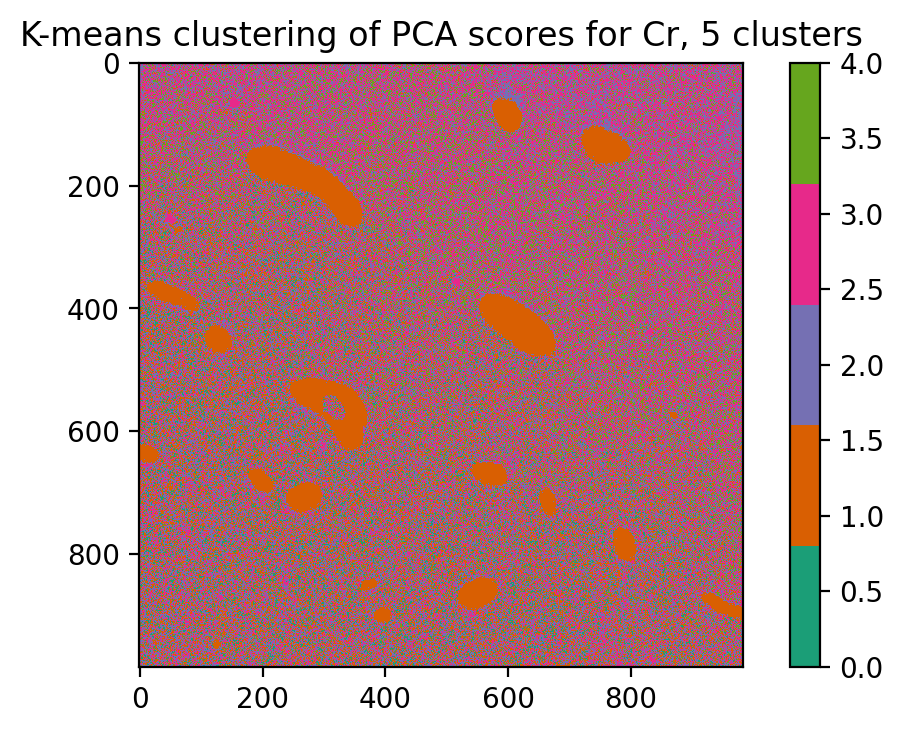

(87, 984, 984)


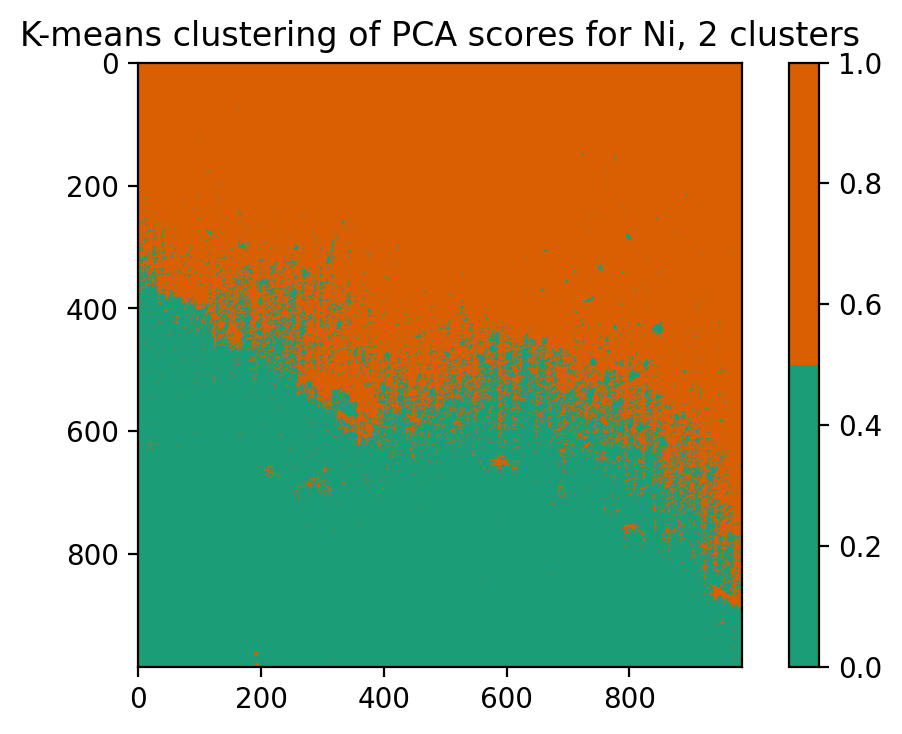

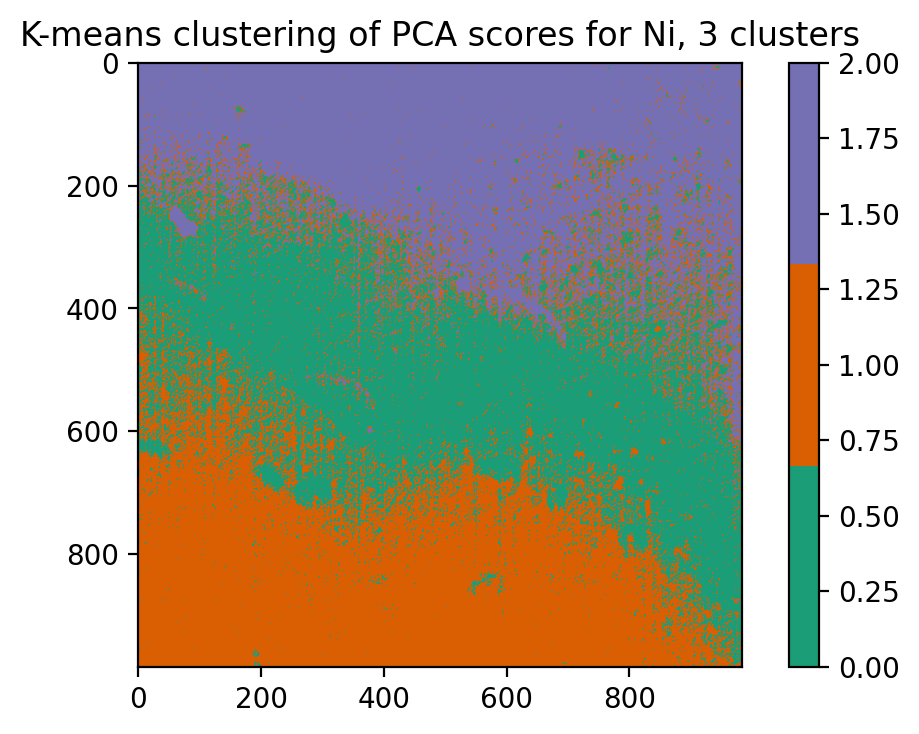

KeyboardInterrupt: 

In [ ]:
#Try kmeans combined with PCA to remove intensity variations from the data- try with 5 PC's and show a couple different cluster numbers
pca = PCA()
std_scale = StandardScaler()

for i, (element,xas_data) in enumerate(xas_elements.items()):
    #print(i,element, xas_data)
    element_data = trim_edges(xas_data)
    print(element_data.shape)
    element_NxM = np.reshape(element_data,(len(element_data),element_data.shape[1]*element_data.shape[2])).T

    pca_scores = pca.fit_transform(element_NxM)

    for j in range(4):

        kmeans = KMeans(n_clusters=j+2)
        #kmeans_results = kmeans.fit_transform(pca_scores[:,:5])
        kmeans_results = kmeans.fit_transform(std_scale.fit_transform(element_NxM))
        
        #make a stepped colormap for visualizing the different classes
        colors = plt.cm.Dark2(np.arange(j+2))
        cmap = ListedColormap(colors)

        plt.imshow(np.reshape(kmeans.labels_,(984,984)).astype(int),cmap=cmap)
        plt.title('K-means clustering of PCA scores for ' + element + ", " + str(j+2) + " clusters")
        plt.colorbar()
        plt.show()
    


    
    